In [29]:
%pip install pyLDAvis

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.6/2.6 MB 11.3 MB/s eta 0:00:00


In [35]:
from wordcloud import WordCloud
import matplotlib.pyplot as plt
import nltk
from nltk.tokenize import sent_tokenize, word_tokenize
from nltk.corpus import stopwords
from collections import Counter, defaultdict
import re
from nltk.util import ngrams
import string
from nltk.stem import PorterStemmer
from nltk.corpus import cmudict
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.cluster import KMeans, DBSCAN
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler
import numpy as np
from nltk import pos_tag
from IPython.display import display, HTML

import pyLDAvis
import pyLDAvis.gensim_models as gensimvis

from textblob import TextBlob
import spacy
from gensim import corpora
from gensim.models import LdaModel

import pandas as pd
import seaborn as sns

from google.colab import drive
drive.mount('/content/drive')

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [2]:
# Ensure nltk resources are downloaded
nltk.download('punkt')
nltk.download('stopwords')

# Load and preprocess text
def load_text(file_path):
    with open(file_path, 'r', encoding='utf-8') as file:
        text = file.read()
    return text

# Clean and tokenize text
def preprocess_text(text):
    sentences = nltk.sent_tokenize(text)

    # Convert to lowercase
    text = text.lower()


    # Remove punctuation
    text = text.translate(str.maketrans('', '', string.punctuation))


    # Tokenize text
    tokens = nltk.word_tokenize(text)

    # Remove stopwords
    stop_words = set(stopwords.words('english'))
    tokens = [word for word in tokens if word not in stop_words]

    return tokens, sentences


[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Unzipping tokenizers/punkt.zip.
[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Unzipping corpora/stopwords.zip.


# The Sirens chapter - Ulysses by James Joyce

In [3]:
# Load the Sirens chapter text
file_path = r'/content/drive/My Drive/NLP/HW/SIRENS.txt'  # Update with your file path
text = load_text(file_path)

# Preprocess text
tokens, sentences = preprocess_text(text)

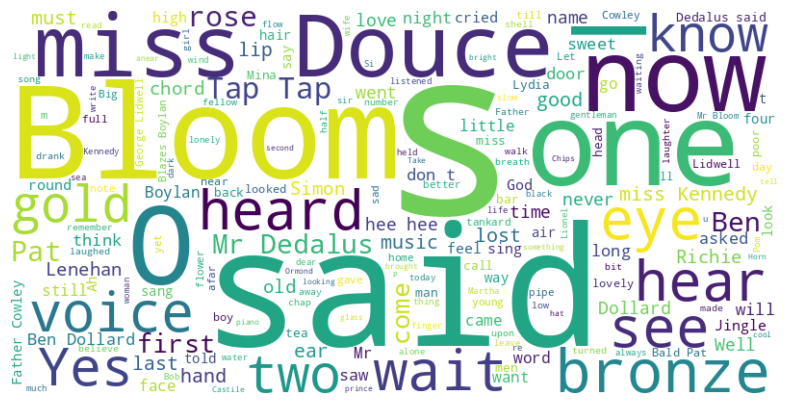

In [ ]:
wordcloud = WordCloud(width=800, height=400, background_color='white',
                      max_words=200, contour_width=3, contour_color='steelblue')

# Generate the word cloud
wordcloud.generate(text)

# Plot the word cloud
plt.figure(figsize=(10, 5))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis('off')  # Hide the axes
plt.show()

## Anaphora detection

In [ ]:
def detect_anaphora(sentences):
    anaphora = defaultdict(list)
    phrase_positions = defaultdict(list)

    for i in range(1, len(sentences)):
        # Tokenize and filter out punctuation
        words_prev = [word.lower() for word in word_tokenize(sentences[i-1].lstrip('—_-_')) if word.isalpha()]
        words_curr = [word.lower() for word in word_tokenize(sentences[i].lstrip('—_-_')) if word.isalpha()]
        longest = 0
        phrase_curr_longest = ''

        for n in range(1, min(5, len(words_curr) + 1)):  # Check up to 4-word phrases
            phrase_prev = ' '.join(words_prev[:n])
            phrase_curr = ' '.join(words_curr[:n])
            if phrase_prev == phrase_curr and phrase_prev:
              longest = n
              phrase_curr_longest = phrase_curr

        if longest != 0:
            phrase_positions[phrase_curr_longest].append(i-1)
            phrase_positions[phrase_curr_longest].append(i)

    for phrase, indices in phrase_positions.items():
      indices = sorted(set(indices))  # Ensure unique and sorted indices
      grouped_indices = []
      temp_group = [indices[0]]

      for j in range(1, len(indices)):
          if indices[j] == indices[j - 1] + 1:
              temp_group.append(indices[j])
          else:
              grouped_indices.append(tuple(temp_group))
              temp_group = [indices[j]]
      grouped_indices.append(tuple(temp_group))  # Add the last group

      anaphora[phrase] = grouped_indices
    return anaphora

In [ ]:
anaphoras = detect_anaphora(sentences)

In [ ]:
print("Number of anaphoras =", len(anaphoras))

Number of anaphoras = 48


In [ ]:
for phrase, indices in anaphoras.items():
    print(f"  {phrase}: {indices}")
print("\n")

  war: [(39, 40), (729, 730)]
  a: [(42, 43), (894, 895, 896), (1665, 1666)]
  full: [(51, 52)]
  pray: [(98, 99)]
  big: [(101, 102), (1894, 1895)]
  where: [(113, 114, 115)]
  they: [(162, 163)]
  hufa: [(188, 189)]
  miss: [(218, 219)]
  i: [(237, 238), (359, 360, 361)]
  chips: [(266, 267)]
  with: [(292, 293)]
  with grace: [(293, 294)]
  yes: [(301, 302, 303)]
  she: [(327, 328)]
  to: [(336, 337)]
  who: [(352, 353)]
  he: [(370, 371), (622, 623), (736, 737)]
  lager: [(389, 390)]
  for: [(408, 409)]
  glass of bitter: [(465, 466)]
  o: [(494, 495), (769, 770, 771)]
  how do: [(591, 592)]
  there was: [(645, 646)]
  right: [(689, 690)]
  never: [(856, 857)]
  how: [(905, 906)]
  bloom: [(1024, 1025)]
  thou: [(1095, 1096)]
  one: [(1097, 1098, 1099), (1397, 1398)]
  the: [(1153, 1154), (1601, 1602), (1644, 1645)]
  while: [(1163, 1164)]
  pat: [(1259, 1260, 1261)]
  heigho: [(1273, 1274)]
  music: [(1390, 1391)]
  talk: [(1414, 1415)]
  pat is a waiter: [(1424, 1425)]
  douce: [

In [ ]:
print(sentences[1738].lstrip('—_-_').rstrip('—_-_'))
print(sentences[1739].lstrip('-_—_').rstrip('—_-_'))
# print(sentences[1738])

Bless me, father,_ Dollard the croppy cried.
Bless me and let me
go._

Tap.


In [ ]:
def highlight_anaphoras(sentences, anaphoras):
    # Adjust for zero-indexing and ensure HTML rendering
    for key_word, indices_list in anaphoras.items():
        for indices in indices_list:
          highlighted_sentences = []
          for index in indices:
            word_regex = r'^\b' + re.escape(key_word) + r'\b'  # '^' asserts position at start of the string
            curr_sentence = sentences[index].replace("\n", " ").lstrip('—_-_')
            highlighted_sentence = re.sub(word_regex, f"<span style='color: red;'>{key_word}</span>", curr_sentence, flags=re.IGNORECASE)
            highlighted_sentences.append(highlighted_sentence)

        # if key_word == "tap":
        #   print(highlighted_sentences)
        combined_highlighted = ' '.join(highlighted_sentences)
        display(HTML(combined_highlighted))  # Use print(sentence) if not in a Jupyter environment


highlight_anaphoras(sentences, anaphoras)


In [ ]:
def print_anaphoras(sentences, anaphoras):
    # Adjust for zero-indexing and ensure HTML rendering
    for key_word, indices_list in anaphoras.items():
        for indices in indices_list:
          highlighted_sentences = []
          for index in indices:
            print(sentences[index], end=" ")
        print()


print_anaphoras(sentences, anaphoras)

War! War! —War! War! 
A sail! A veil awave upon the waves. A low incipient note sweet banshee
murmured: all. A thrush. A throstle. A boy. A croppy boy. 
Full tup. Full throb. 
Pray for him! Pray, good people! 
Big Benaben. Big Benben. Big Benaben Dollard. Big Benben. 
Where bronze from anear? Where gold from afar? Where hoofs? 
They cowered
under their reef of counter, waiting on footstools, crates upturned,
waiting for their teas to draw. They pawed their blouses, both of black
satin, two and nine a yard, waiting for their teas to draw, and two and
seven. 
Hufa! Hufa! 
Miss Kennedy lipped her cup again, raised, drank a sip and
gigglegiggled. Miss Douce, bending over the teatray, ruffled again her
nose and rolled droll fattened eyes. 
I
wished I hadn’t laughed so much. I feel all wet. —I see, he said. I didn’t recognise him for the moment. I hear he is
keeping very select company. 
Chips, picking chips off one of his
rocky thumbnails. Chips. 
—With the greatest alacrity, miss Douce agr

In [ ]:
def plot_anaphora(anaphora, sentences):
    fig, ax = plt.subplots(figsize=(12, 8))

    y_labels = []
    colors = plt.cm.tab20.colors  # Color map for variety
    y_positions = range(len(anaphora))

    for i, (phrase, indices) in enumerate(anaphora.items()):
        y_labels.append(f"{phrase} (Count: {len(indices)})")
        color = colors[i % len(colors)]
        for group in indices:
            ax.plot(group, [i] * len(group), marker='o', linestyle='-', color=color)

    ax.set_yticks(y_positions)
    ax.set_yticklabels(y_labels)
    ax.set_xlabel('Sentence Index')
    ax.set_title('Detected Anaphoras in Text with Count')
    plt.grid(True)
    plt.tight_layout()
    plt.show()


def plot_anaphora_count(anaphora):
    phrases = list(anaphora.keys())
    counts = [len(indices) for indices in anaphora.values()]

    fig, ax = plt.subplots(figsize=(10, 6))
    bars = ax.bar(phrases, counts, color='skyblue')

    # Rotate the x-axis labels for better readability
    plt.xticks(rotation=90)

    # Add text labels to bars
    for bar in bars:
        height = bar.get_height()
        ax.text(bar.get_x() + bar.get_width() / 2, height, f'{height}', ha='center', va='bottom')

    ax.set_ylabel('Count')
    ax.set_title('Count of Detected Anaphoras')
    plt.tight_layout()
    plt.show()

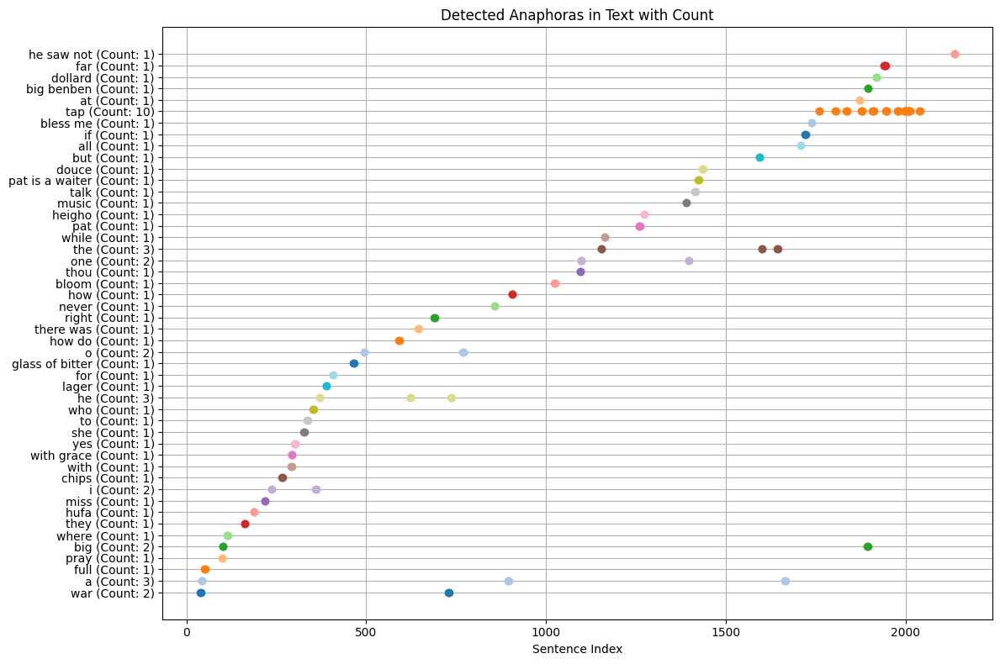

In [ ]:
plot_anaphora(anaphoras, sentences)


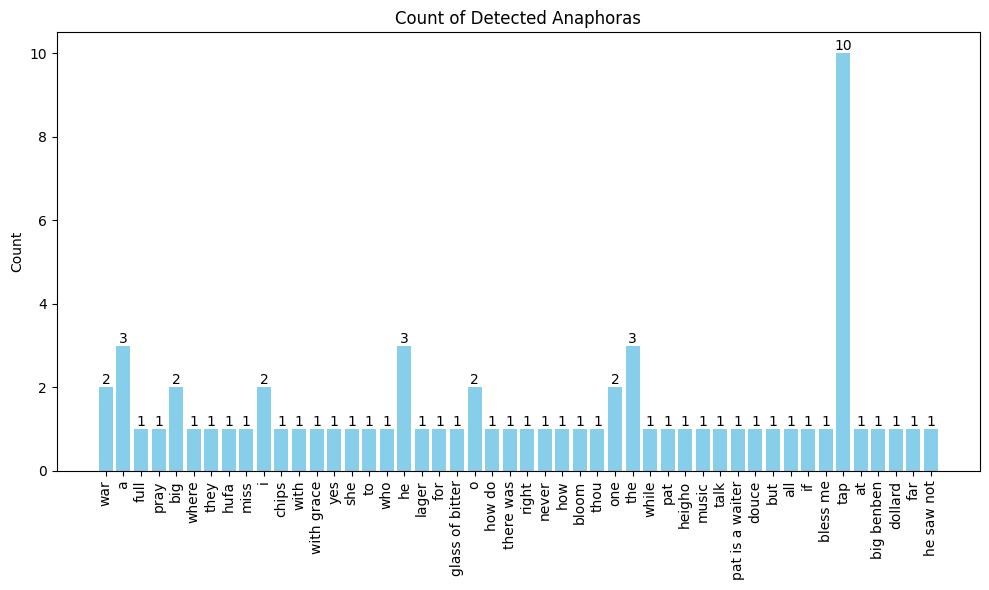

In [ ]:
plot_anaphora_count(anaphoras)

## Anadiplosis detection



In [ ]:
def detect_anadiplosis(sentences):
    anadiplosis = defaultdict(list)
    phrase_positions = defaultdict(list)

    for i in range(1, len(sentences)):
        # Tokenize and filter out punctuation
        words_prev = [word.lower() for word in word_tokenize(sentences[i-1].lstrip('—_-_—')) if word.isalpha()]
        words_curr = [word.lower() for word in word_tokenize(sentences[i].lstrip('—_-_ —')) if word.isalpha()]
        longest = 0
        phrase_curr_longest = ''

        max_n = min(5, len(words_prev) + 1, len(words_curr) + 1)  # Maximum phrase length to check

        for n in range(1, max_n):
            phrase_prev = ' '.join(words_prev[-n:])  # Last n words of previous sentence
            phrase_curr = ' '.join(words_curr[:n])  # First n words of current sentence
            if phrase_prev == phrase_curr and phrase_prev:
                longest = n
                phrase_curr_longest = phrase_curr

        if longest != 0:
            phrase_positions[phrase_curr_longest].append(i-1)
            phrase_positions[phrase_curr_longest].append(i)

    for phrase, indices in phrase_positions.items():
        indices = sorted(set(indices))  # Ensure unique and sorted indices
        grouped_indices = []
        temp_group = [indices[0]]

        for j in range(1, len(indices)):
            if indices[j] == indices[j - 1] + 1:
                temp_group.append(indices[j])
            else:
                grouped_indices.append(tuple(temp_group))
                temp_group = [indices[j]]
        grouped_indices.append(tuple(temp_group))  # Add the last group

        anadiplosis[phrase] = grouped_indices

    return anadiplosis

In [ ]:
def plot_anadiplosis(anadiplosis, sentences):
    fig, ax = plt.subplots(figsize=(12, 8))

    y_labels = []
    colors = plt.cm.tab20.colors  # Color map for variety
    y_positions = range(len(anadiplosis))

    for i, (phrase, indices) in enumerate(anadiplosis.items()):
        y_labels.append(f"{phrase} (Count: {len(indices)})")
        color = colors[i % len(colors)]
        for group in indices:
            ax.plot(group, [i] * len(group), marker='o', linestyle='-', color=color)

    ax.set_yticks(y_positions)
    ax.set_yticklabels(y_labels)
    ax.set_xlabel('Sentence Index')
    ax.set_title('Detected Anadiplosis in Text with Count')
    plt.grid(True)
    plt.tight_layout()
    plt.show()

def plot_anadiplosis_count(anadiplosis):
    phrases = list(anadiplosis.keys())
    counts = [len(indices) for indices in anadiplosis.values()]

    fig, ax = plt.subplots(figsize=(14, 8))
    bars = ax.bar(phrases, counts, color='lightcoral')

    # Rotate the x-axis labels for better readability
    plt.xticks(rotation=90)

    # Add text labels to bars
    for bar in bars:
        height = bar.get_height()
        ax.text(bar.get_x() + bar.get_width() / 2, height, f'{height}', ha='center', va='bottom')

    ax.set_ylabel('Count')
    ax.set_title('Count of Detected Anadiplosis')
    plt.tight_layout()
    plt.show()

In [ ]:
anadiplosis = detect_anadiplosis(sentences)

In [ ]:
print("Number of anadiplosis =", len(anadiplosis))

Number of anadiplosis = 23


In [ ]:
print("ANADIPLOSIS:")
for phrase, indices in anadiplosis.items():
    print(f"  {phrase}: {indices}")
print("\n")

ANADIPLOSIS:
  blew: [(5, 6)]
  war: [(39, 40), (729, 730)]
  hufa: [(188, 189)]
  yes: [(301, 302, 303), (1920, 1921)]
  who: [(352, 353)]
  glass of bitter: [(465, 466)]
  o: [(494, 495)]
  how do: [(591, 592)]
  softly: [(831, 832)]
  with it: [(950, 951)]
  it simon: [(951, 952)]
  heigho: [(1273, 1274)]
  to: [(1312, 1313)]
  other: [(1314, 1315)]
  believe: [(1318, 1319)]
  talk: [(1414, 1415)]
  while you wait: [(1431, 1432)]
  if not: [(1720, 1721)]
  hate: [(1723, 1724)]
  tap: [(1760, 1761), (1805, 1806), (1836, 1837, 1838), (1878, 1879, 1880), (1908, 1909, 1910, 1911), (1945, 1946, 1947, 1948), (1978, 1979, 1980, 1981), (1997, 1998, 1999, 2000, 2001), (2006, 2007, 2008, 2009, 2010, 2011, 2012, 2013), (2039, 2040)]
  big benben: [(1895, 1896)]
  the name: [(1916, 1917)]
  far: [(1941, 1942, 1943, 1944)]




In [ ]:
print(sentences[1318], sentences[1319])

You must
believe. Believe.


In [ ]:
def highlight_anadiplosis(sentences, anadiplosis):
    # Adjust for zero-indexing and ensure HTML rendering
    for key_word, indices_list in anadiplosis.items():
        for indices in indices_list:
          highlighted_sentences = []
          for index in indices:
            word_regex = r'\b' + re.escape(key_word) + r'\b'  # '^' asserts position at start of the string
            curr_sentence = sentences[index].replace("\n", " ")
            highlighted_sentence = re.sub(word_regex, f"<span style='color: red;'>{key_word}</span>", curr_sentence, flags=re.IGNORECASE)
            highlighted_sentences.append(highlighted_sentence)

        # if key_word == "tap":
        #   print(highlighted_sentences)
        combined_highlighted = ' '.join(highlighted_sentences)
        display(HTML(combined_highlighted))  # Use print(sentence) if not in a Jupyter environment


highlight_anadiplosis(sentences, anadiplosis)

In [ ]:
def print_anadiplosis(sentences, anadiplosis):
    # Adjust for zero-indexing and ensure HTML rendering
    for key_word, indices_list in anadiplosis.items():
        for indices in indices_list:
          highlighted_sentences = []
          for index in indices:
            print(sentences[index], end=" ")
        print()


print_anadiplosis(sentences, anadiplosis)

A husky fifenote blew. Blew. 
War! War! —War! War! 
Hufa! Hufa! 
Yes. Yes. Yes. Dollard, yes. Yes, her lips said more loudly, Mr Dollard. 
Who? —Who may he be? 
Glass of bitter? Glass of bitter, please, and a
sloegin for me. 
—O! O! 
How do? How do? 
Hoarsely the apple of his throat hoarsed softly. Softly
he sang to a dusty seascape there: _A Last Farewell._ A headland, a
ship, a sail upon the billows. 
Dollard and Cowley still urged the lingering singer out with it. —With it, Simon. 
—With it, Simon. —It, Simon. 
Heigho! Heigho! 
Want to. To keep it up. 
Call me that other. Other
world she wrote. 
You must
believe. Believe. 
Talk. Talk. 
He
waits while you wait. While you wait if you wait he will wait while you
wait. 
Or if not? If not? 
He bore no hate. Hate. 
Tap. Tap. Tap. Tap. Tap. Tap. Tap. Tap. Tap. Tap. Tap. Tap. Tap. Tap. Tap. Tap. Tap. Tap. Tap. Tap. Tap. Tap. Tap. Tap. Tap. Tap. Tap

—Very, Mr Dedalus said, staring hard at a headless sardine. Tap. Tap. Tap. Tap. Tap. Tap. Ta

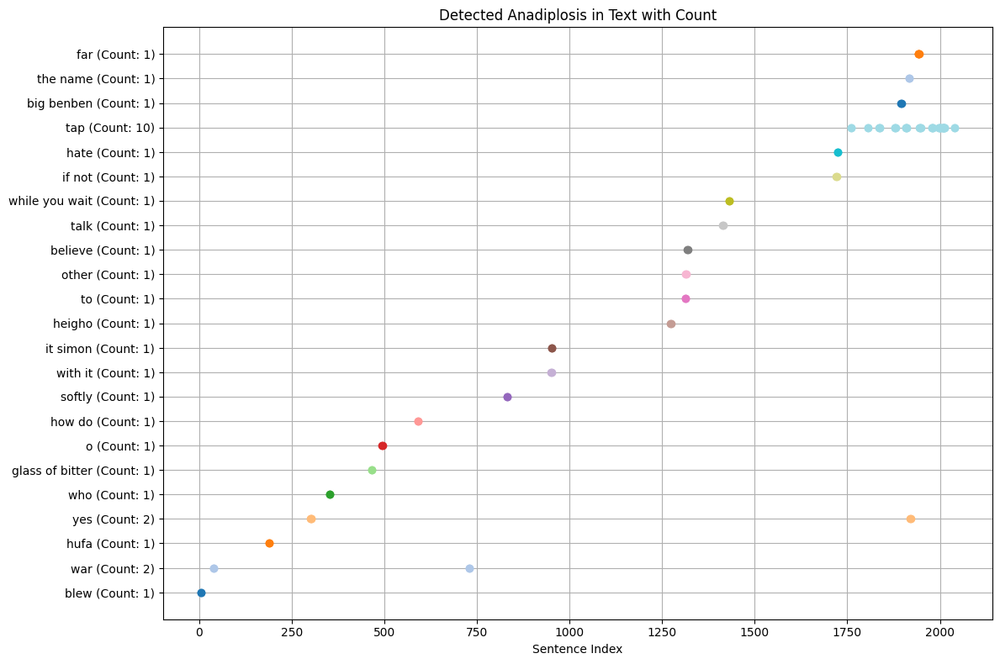

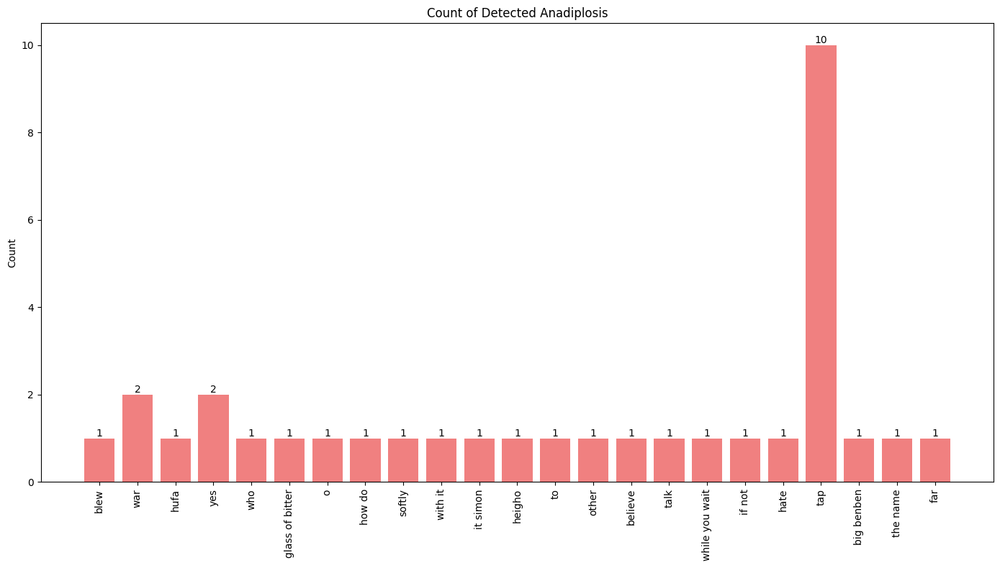

In [ ]:
plot_anadiplosis(anadiplosis, sentences)

# Plot the vertical bar chart of anadiplosis counts
plot_anadiplosis_count(anadiplosis)

## Epistrophe detection

In [ ]:
def detect_epistrophe(sentences):
    epistrophe = defaultdict(list)
    phrase_positions = defaultdict(list)

    for i in range(1, len(sentences)):
        # Tokenize and filter out punctuation
        words_prev = [word.lower() for word in word_tokenize(sentences[i-1].lstrip('—_-_—').rstrip('—_-_—')) if word.isalpha()]
        words_curr = [word.lower() for word in word_tokenize(sentences[i].lstrip('—_-_—').rstrip('—_-_—')) if word.isalpha()]
        longest = 0
        phrase_curr_longest = ''

        max_n = min(5, len(words_prev) + 1, len(words_curr) + 1)  # Maximum phrase length to check

        for n in range(1, max_n):
            phrase_prev = ' '.join(words_prev[-n:])  # Last n words of previous sentence
            phrase_curr = ' '.join(words_curr[-n:])  # Last n words of current sentence
            if phrase_prev == phrase_curr and phrase_prev:
                longest = n
                phrase_curr_longest = phrase_curr

        if longest != 0:
            phrase_positions[phrase_curr_longest].append(i-1)
            phrase_positions[phrase_curr_longest].append(i)

    # Consolidate consecutive indices into tuples
    for phrase, indices in phrase_positions.items():
        indices = sorted(set(indices))  # Ensure unique and sorted indices
        grouped_indices = []
        temp_group = [indices[0]]

        for j in range(1, len(indices)):
            if indices[j] == indices[j - 1] + 1:
                temp_group.append(indices[j])
            else:
                grouped_indices.append(tuple(temp_group))
                temp_group = [indices[j]]
        grouped_indices.append(tuple(temp_group))  # Add the last group

        epistrophe[phrase] = grouped_indices

    return epistrophe

In [ ]:
# Function to plot epistrophe with counts
def plot_epistrophe(epistrophe, sentences):
    fig, ax = plt.subplots(figsize=(12, 8))

    y_labels = []
    colors = plt.cm.tab20.colors  # Color map for variety
    y_positions = range(len(epistrophe))

    for i, (phrase, indices) in enumerate(epistrophe.items()):
        y_labels.append(f"{phrase} (Count: {len(indices)})")
        color = colors[i % len(colors)]
        for group in indices:
            ax.plot(group, [i] * len(group), marker='o', linestyle='-', color=color)

    ax.set_yticks(y_positions)
    ax.set_yticklabels(y_labels)
    ax.set_xlabel('Sentence Index')
    ax.set_title('Detected Epistrophe in Text with Count')
    plt.grid(True)
    plt.tight_layout()
    plt.show()

# Function to create a vertical bar plot of epistrophe and their counts
def plot_epistrophe_count(epistrophe):
    phrases = list(epistrophe.keys())
    counts = [len(indices) for indices in epistrophe.values()]

    fig, ax = plt.subplots(figsize=(14, 8))
    bars = ax.bar(phrases, counts, color='lightgreen')

    # Rotate the x-axis labels for better readability
    plt.xticks(rotation=90)

    # Add text labels to bars
    for bar in bars:
        height = bar.get_height()
        ax.text(bar.get_x() + bar.get_width() / 2, height, f'{height}', ha='center', va='bottom')

    ax.set_ylabel('Count')
    ax.set_title('Count of Detected Epistrophe')
    plt.tight_layout()
    plt.show()

In [ ]:
epistrophes = detect_epistrophe(sentences)

In [ ]:
print("Number of epistrophes =", len(epistrophes))

Number of epistrophes = 45


In [ ]:
print("EPISTROPHE:")
for phrase, indices in epistrophes.items():
    print(f"  {phrase}: {indices}")
print("\n")

EPISTROPHE:
  blew: [(5, 6)]
  smack: [(30, 31)]
  war: [(39, 40), (729, 730)]
  hee: [(80, 81)]
  fro: [(90, 91)]
  bloom: [(95, 96), (320, 321)]
  she cried: [(178, 179)]
  hufa: [(188, 189)]
  eye: [(194, 195)]
  eyes: [(219, 220)]
  o: [(231, 232), (494, 495)]
  away: [(280, 281)]
  yes: [(301, 302, 303)]
  lenehan: [(312, 313)]
  see: [(369, 370)]
  yet: [(467, 468)]
  on: [(489, 490)]
  how do: [(591, 592)]
  cider: [(614, 615)]
  ate: [(718, 719)]
  trouble: [(752, 753)]
  it simon: [(951, 952)]
  door of the bar: [(962, 963)]
  me: [(1080, 1081)]
  where: [(1092, 1093)]
  so: [(1199, 1200, 1201, 1202)]
  said: [(1222, 1223)]
  heigho: [(1273, 1274)]
  believe: [(1318, 1319)]
  do: [(1399, 1400)]
  talk: [(1414, 1415)]
  while you wait: [(1431, 1432)]
  smiled: [(1492, 1493)]
  now: [(1557, 1558)]
  wait: [(1593, 1594)]
  listened: [(1641, 1642, 1643)]
  boy: [(1665, 1666), (1884, 1885)]
  if not: [(1720, 1721)]
  hate: [(1723, 1724)]
  tap: [(1760, 1761), (1805, 1806), (1836, 1

In [ ]:
print(sentences[1199], sentences[1200])

First gentleman told Mina that was so. She asked him was that so.


In [ ]:
def highlight_epistrophes(sentences, epistrophes):
    # Adjust for zero-indexing and ensure HTML rendering
    for key_word, indices_list in epistrophes.items():
        for indices in indices_list:
          highlighted_sentences = []
          for index in indices:
            word_regex = r'\b' + re.escape(key_word) + r'\b'  # '^' asserts position at start of the string
            curr_sentence = sentences[index].replace("\n", " ")
            highlighted_sentence = re.sub(word_regex, f"<span style='color: red;'>{key_word}</span>", curr_sentence, flags=re.IGNORECASE)
            highlighted_sentences.append(highlighted_sentence)

        # if key_word == "tap":
        #   print(highlighted_sentences)
        combined_highlighted = ' '.join(highlighted_sentences)
        display(HTML(combined_highlighted))  # Use print(sentence) if not in a Jupyter environment


highlight_epistrophes(sentences, epistrophes)

In [ ]:
def print_epistrophes(sentences, epistrophes):
    # Adjust for zero-indexing and ensure HTML rendering
    for key_word, indices_list in epistrophes.items():
        for indices in indices_list:
          highlighted_sentences = []
          for index in indices:
            print(sentences[index], end=" ")
        print()


print_anaphoras(sentences, epistrophes)

A husky fifenote blew. Blew. 
Smack. _La cloche!_ Thigh smack. 
War! War! —War! War! 
Hee hee. Wait while you hee. 
Fro. To, fro. 
Bloom. Old Bloom. Bloom. Old Bloom. 
—No, don’t, she cried. —I won’t listen, she cried. 
Hufa! Hufa! 
Will you ever forget his goggle eye? Miss Douce chimed in in deep bronze laughter, shouting:

—And your other eye! 
Miss Douce, bending over the teatray, ruffled again her
nose and rolled droll fattened eyes. Again Kennygiggles, stooping, her
fair pinnacles of hair, stooping, her tortoise napecomb showed,
spluttered out of her mouth her tea, choking in tea and laughter,
coughing with choking, crying:

—O greasy eyes! 
All flushed (O! ),
panting, sweating (O! —O! O! 
Miss Douce of satin douced her arm away. —O go away! 
Yes. Yes. Yes. 
In came Lenehan. Round him peered Lenehan. 
I see. He see. 
Wire in yet? Not yet. 
Come on. Richie led on. 
How do? How do? 
Cider. Yes, bottle of cider. 
As said before
he ate with relish the inner organs, nutty gizzards, fri

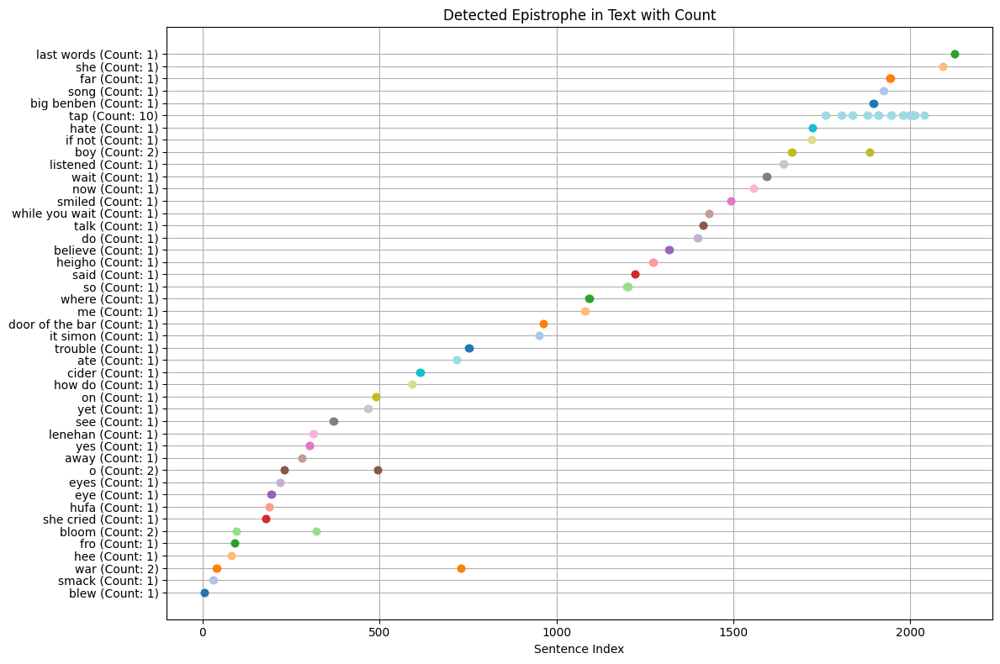

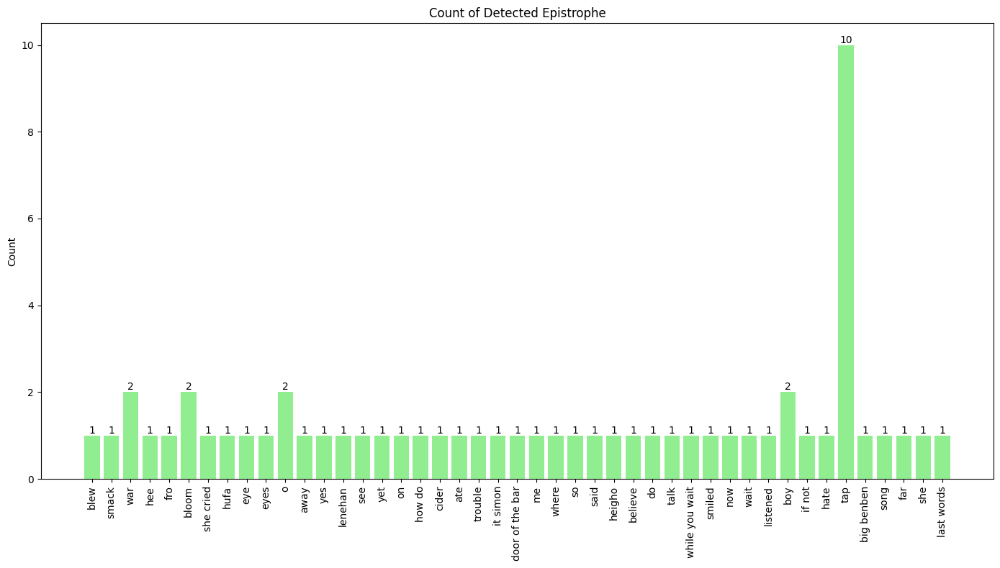

In [ ]:
# Plot the epistrophe results with counts
plot_epistrophe(epistrophes, sentences)

# Plot the vertical bar chart of epistrophe counts
plot_epistrophe_count(epistrophes)

## Epizeuxis detection

In [ ]:
# Function to detect epizeuxis
def detect_epizeuxis(sentences):
    epizeuxis = defaultdict(list)

    for i, sentence in enumerate(sentences):
        words = [word.lower() for word in word_tokenize(sentence.lstrip('—_-_—').rstrip('—_-_—')) if word.isalpha()]
        max_n = min(5, len(words))  # Maximum phrase length to check
        longest_phrase = ""

        for n in range(1, max_n):
            for j in range(len(words) - 2*n + 1):  # Ensure room for repeated phrases
                phrase = ' '.join(words[j:j+n])
                next_phrase = ' '.join(words[j+n:j+2*n])
                if phrase == next_phrase and len(phrase) > len(longest_phrase):
                    longest_phrase = phrase

        if longest_phrase:
            epizeuxis[longest_phrase].append(i)

    return epizeuxis

In [ ]:
def plot_epizeuxis(epizeuxis, sentences):
    fig, ax = plt.subplots(figsize=(12, 8))

    y_labels = []
    colors = plt.cm.tab20.colors  # Color map for variety
    y_positions = range(len(epizeuxis))

    for i, (phrase, indices) in enumerate(epizeuxis.items()):
        y_labels.append(f"{phrase} (Count: {len(indices)})")
        color = colors[i % len(colors)]
        ax.plot(indices, [i] * len(indices), 'o', color=color)  # Plot only markers

    ax.set_yticks(y_positions)
    ax.set_yticklabels(y_labels)
    ax.set_xlabel('Sentence Index')
    ax.set_title('Detected Epizeuxis in Text with Count')
    plt.grid(True)
    plt.tight_layout()
    plt.show()

# Function to create a vertical bar plot of epizeuxis and their counts
def plot_epizeuxis_bar(epizeuxis):
    phrases = list(epizeuxis.keys())
    counts = [len(indices) for indices in epizeuxis.values()]

    fig, ax = plt.subplots(figsize=(14, 8))
    bars = ax.bar(phrases, counts, color='lightblue')

    # Rotate the x-axis labels for better readability
    plt.xticks(rotation=90)

    # Add text labels to bars
    for bar in bars:
        height = bar.get_height()
        ax.text(bar.get_x() + bar.get_width() / 2, height, f'{height}', ha='center', va='bottom')

    ax.set_ylabel('Count')
    ax.set_title('Count of Detected Epizeuxis')
    plt.tight_layout()
    plt.show()

In [ ]:
epizeuxis = detect_epizeuxis(sentences)

In [ ]:
print("Number of epizeuxis =", len(epizeuxis))

Number of epizeuxis = 48


In [ ]:
print("EPIZEUXIS:")
for phrase, indices in epizeuxis.items():
    print(f"  {phrase}: {indices}")
print("\n")

EPIZEUXIS:
  trilling: [10]
  jingle: [23]
  far: [63]
  no: [74]
  hee: [80, 1428]
  ay: [108, 683, 2129]
  by: [145]
  them: [146]
  in: [195]
  sighing: [217]
  each: [227]
  coffin: [393]
  wait: [540]
  please: [548]
  eyed: [574]
  after: [576]
  come on: [619]
  contrast: [644]
  of: [702]
  haw: [726]
  mashed: [760]
  jiggedy: [805]
  jaunty: [807]
  good: [968]
  throb a: [1020]
  long: [1101]
  admired: [1138]
  more: [1191]
  that: [1202, 1461]
  the first: [1203]
  yes: [1311]
  tum: [1358]
  la: [1366, 1370]
  hee hee: [1426, 1430, 1433, 1592, 2139]
  one one one: [1508]
  look look look: [1519]
  do: [1568]
  he came: [1572]
  waiting: [1591]
  rose: [1817]
  breath: [1818]
  tiny: [1819]
  eyes her: [1834]
  walk: [1854]
  wee little: [1970]
  pom: [2070]
  march along: [2071]
  kran: [2150]




In [ ]:
print(sentences[393])

gazed in the coffin (coffin?)


In [ ]:
def highlight_epizeuxis(sentences, epizeuxis):
    # Adjust for zero-indexing and ensure HTML rendering
    for key_word, indices_list in epizeuxis.items():
        highlighted_sentences = []
        for indices in indices_list:
            word_regex = r'\b' + re.escape(key_word) + r'\b'  # '^' asserts position at start of the string
            curr_sentence = sentences[indices].replace("\n", " ")
            highlighted_sentence = re.sub(word_regex, f"<span style='color: red;'>{key_word}</span>", curr_sentence, flags=re.IGNORECASE)
            highlighted_sentences.append(highlighted_sentence)

        combined_highlighted = ' '.join(highlighted_sentences)
        display(HTML(combined_highlighted))  # Use print(sentence) if not in a Jupyter environment


highlight_epizeuxis(sentences, epizeuxis)

In [ ]:
def print_epizeuxis(sentences, epizeuxis):
    # Adjust for zero-indexing and ensure HTML rendering
    for key_word, indices_list in epizeuxis.items():
        for indices in indices_list:
          print(sentences[indices], end=" ")
        print()


print_epizeuxis(sentences, epizeuxis)

Trilling, trilling: Idolores. 
Jingle jingle jaunted jingling. 
A moonlit nightcall: far, far. 
Did not: no, no: believe: Lidlyd. 
Hee hee. Hee hee. 
Ay, ay. —Ay, ay, Mr Dedalus nodded. —Ay, ay, Ben. 
Bloowho went by by Moulang’s pipes bearing in his breast the sweets of
sin, by Wine’s antiques, in memory bearing sweet sinful words, by
Carroll’s dusky battered plate, for Raoul. 
The boots to them, them in the bar, them barmaids came. 
Miss Douce chimed in in deep bronze laughter, shouting:

—And your other eye! 
Ah, panting, sighing, sighing, ah, fordone, their mirth died down. 
Shrill, with deep laughter, after, gold after bronze, they urged each
each to peal after peal, ringing in changes, bronzegold, goldbronze,
shrilldeep, to laughter after laughter. 
gazed in the coffin (coffin?) 
Wait, wait. 
—Please, please. 
Boylan, eyed, eyed. 
His spellbound
eyes went after, after her gliding head as it went down the bar by
mirrors, gilded arch for ginger ale, hock and claret glasses
shimmeri

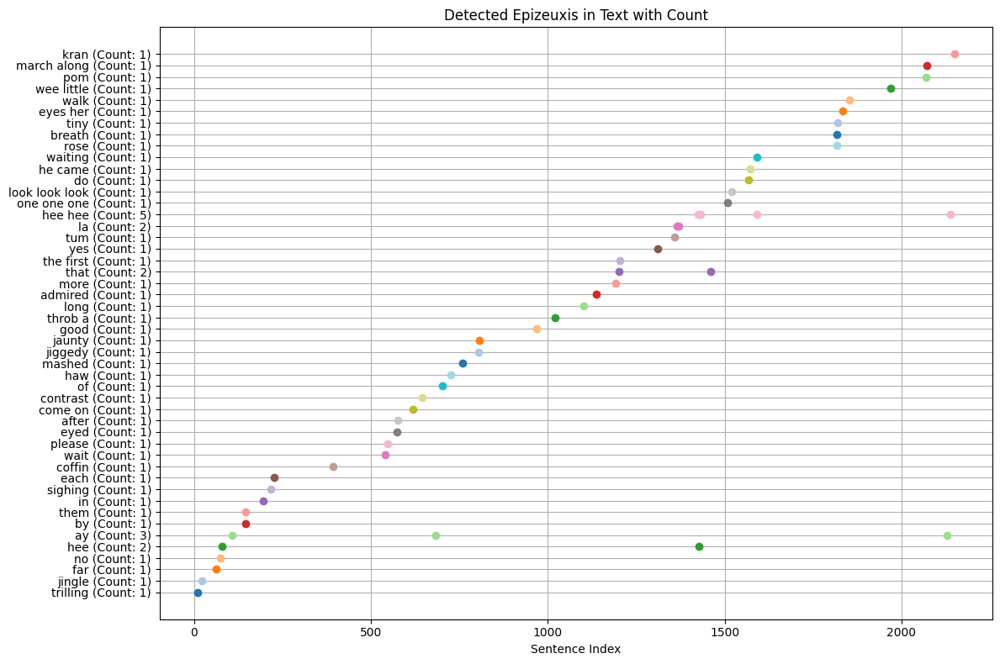

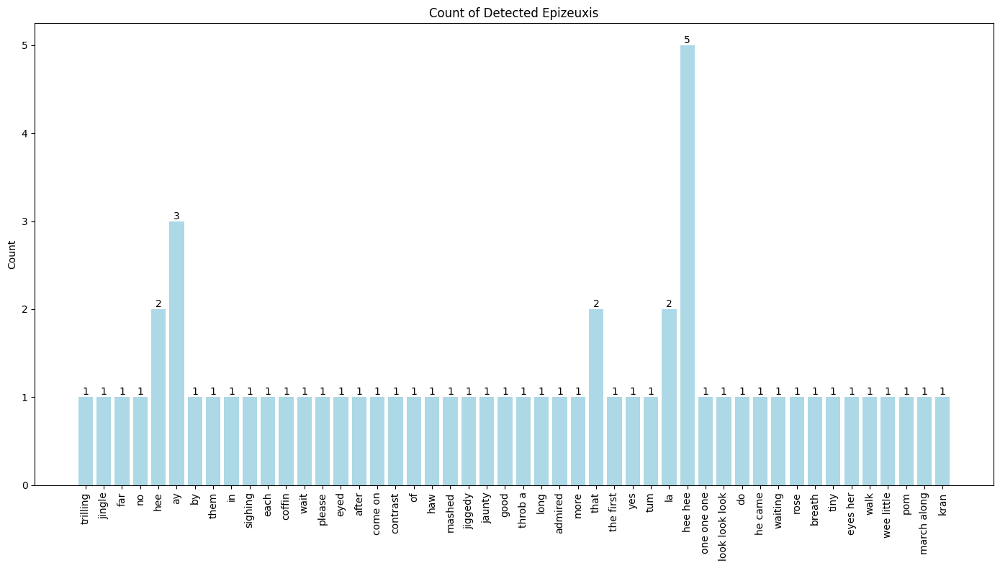

In [ ]:
# Plot the epizeuxis results with counts
plot_epizeuxis(epizeuxis, sentences)

# Plot the vertical bar chart of epizeuxis counts
plot_epizeuxis_bar(epizeuxis)

## Polyptoton detection

In [ ]:
def detect_polyptoton(sentences):
    polyptoton = defaultdict(list)
    stemmer = PorterStemmer()

    for i, sentence in enumerate(sentences):
        words = [word.lower() for word in word_tokenize(sentence.lstrip('—_-_—').rstrip('—_-_—')) if word.isalpha()]
        stems = defaultdict(set)

        for word in words:
            stem = stemmer.stem(word)
            stems[stem].add(word)

        for stem, word_set in stems.items():
            # Check if there are multiple distinct words with the same root
            if len(word_set) > 1:
                polyptoton[tuple(sorted(word_set))].append(i)

    return polyptoton

In [ ]:
# Function to plot polyptoton with counts
def plot_polyptoton(polyptoton, sentences):
    fig, ax = plt.subplots(figsize=(12, 8))

    y_labels = []
    colors = plt.cm.tab20.colors  # Color map for variety
    y_positions = range(len(polyptoton))

    for i, (words, indices) in enumerate(polyptoton.items()):
        phrase = ', '.join(words)
        y_labels.append(f"{phrase} (Count: {len(indices)})")
        color = colors[i % len(colors)]
        ax.plot(indices, [i] * len(indices), 'o', linestyle='None', color=color)  # Plot only markers

    ax.set_yticks(y_positions)
    ax.set_yticklabels(y_labels)
    ax.set_xlabel('Sentence Index')
    ax.set_title('Detected Polyptoton in Text with Count')
    plt.grid(True)
    plt.tight_layout()
    plt.show()

# Function to create a vertical bar plot of polyptoton and their counts
def plot_polyptoton_bar(polyptoton):
    phrases = [' , '.join(words) for words in polyptoton.keys()]
    counts = [len(indices) for indices in polyptoton.values()]

    fig, ax = plt.subplots(figsize=(14, 8))
    bars = ax.bar(phrases, counts, color='lightpink')

    # Rotate the x-axis labels for better readability
    plt.xticks(rotation=90)

    # Add text labels to bars
    for bar in bars:
        height = bar.get_height()
        ax.text(bar.get_x() + bar.get_width() / 2, height, f'{height}', ha='center', va='bottom')

    ax.set_ylabel('Count')
    ax.set_title('Count of Detected Polyptoton')
    plt.tight_layout()
    plt.show()

In [ ]:
polyptotons = detect_polyptoton(sentences)

In [ ]:
print("Number of polyptotons =", len(polyptotons))

Number of polyptotons = 28


In [ ]:
print("POLYPTOTON:")
for words, indices in polyptotons.items():
    print(f"  {', '.join(words)}: {indices}")
print("\n")

POLYPTOTON:
  jingle, jingling: [23]
  sweet, sweets: [145, 213]
  sin, sinful: [145]
  sip, sipped: [186]
  douce, douced: [280]
  it, its: [439, 1101, 1490]
  eyed, eyes: [542]
  chord, chords: [559]
  mirrored, mirrors: [576]
  roll, rolled: [728]
  lieuten, lieutenant: [754]
  hoarsed, hoarsely: [831]
  waited, waiting: [966]
  merciful, mercy: [969]
  flow, flowed: [1026]
  dilate, dilating: [1029]
  pour, pouring: [1033]
  wait, waiting: [1052]
  cried, cry: [1089]
  soar, soared, soaring: [1101]
  jingle, jingled: [1341]
  wait, waits: [1425, 1427, 1431]
  jog, jogged: [1541]
  die, dying: [1809]
  hand, hands: [1832]
  pray, prayed: [1881]
  tap, tapping: [1950]
  whiff, whiffs: [2041]




In [ ]:
print(sentences[23])
# print(sentences[145])

Jingle jingle jaunted jingling.


In [ ]:
def highlight_polyptotons(sentences, polyptotons):
    # Adjust for zero-indexing and ensure HTML rendering
    for key_word, indices_list in polyptotons.items():
        highlighted_sentences = []
        for indice in indices_list:
          curr_sentence = sentences[indice].replace("\n", " ")
          for key in key_word:
            word_regex = r'\b' + re.escape(key) + r'\b'  # '^' asserts position at start of the string
            curr_sentence = re.sub(word_regex, f"<span style='color: red;'>{key}</span>", curr_sentence, flags=re.IGNORECASE)
          highlighted_sentences.append(curr_sentence)

        combined_highlighted = ' '.join(highlighted_sentences)
        display(HTML(combined_highlighted))  # Use print(sentence) if not in a Jupyter environment


highlight_polyptotons(sentences, polyptotons)

In [ ]:
def print_polyptotons(sentences, polyptotons):
    # Adjust for zero-indexing and ensure HTML rendering
    for key_word, indices_list in polyptotons.items():
        for indices in indices_list:
          print(sentences[indices], end=" ")
        print()


print_polyptotons(sentences, polyptotons)

Jingle jingle jaunted jingling. 
Bloowho went by by Moulang’s pipes bearing in his breast the sweets of
sin, by Wine’s antiques, in memory bearing sweet sinful words, by
Carroll’s dusky battered plate, for Raoul. Sweet are the sweets. 
Bloowho went by by Moulang’s pipes bearing in his breast the sweets of
sin, by Wine’s antiques, in memory bearing sweet sinful words, by
Carroll’s dusky battered plate, for Raoul. 
She sipped distastefully her brew, hot tea, a sip, sipped, sweet tea. 
Miss Douce of satin douced her arm away. 
It throbbed, pure, purer, softly
and softlier, its buzzing prongs. _—Come!_

It soared, a bird, it held its flight, a swift pure cry, soar silver
orb it leaped serene, speeding, sustained, to come, don’t spin it out
too long long breath he breath long life, soaring high, high
resplendent, aflame, crowned, high in the effulgence symbolistic, high,
of the etherial bosom, high, of the high vast irradiation everywhere
all soaring all around about the all, the endlessnes

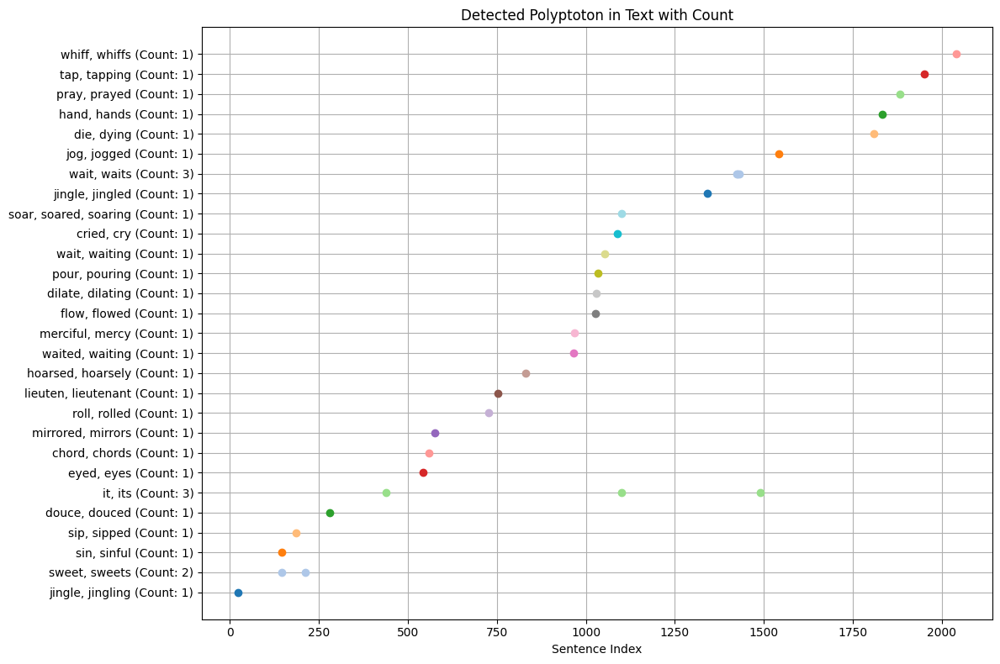

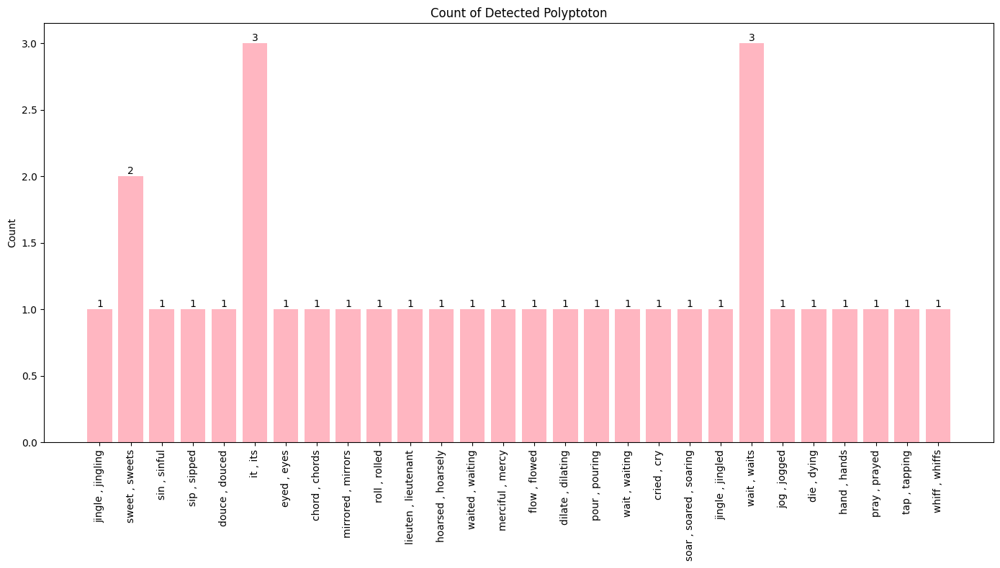

In [ ]:
# Plot the polyptoton results with counts
plot_polyptoton(polyptotons, sentences)

# Plot the vertical bar chart of polyptoton counts
plot_polyptoton_bar(polyptotons)

## Euphony detection

In [ ]:
euphonic_consonants = set("LMNRWVSFHZ")

def is_euphonic(word):
    """Check if a word is euphonic based on the presence of euphonic consonants."""
    return any(char in euphonic_consonants for char in word.upper())

def euphony_score(sentence):
    """Calculate a euphony score for a sentence based on the presence of euphonic consonants."""
    words = word_tokenize(sentence)
    euphonic_words = [word for word in words if is_euphonic(word)]
    return len(euphonic_words) / len(words) if words else 0


def detect_euphonies(sentences, threshold=0.5):
  euphonic_sentences = []
  for i, sentence in enumerate(sentences):
    score = euphony_score(sentence)
    if score >= threshold:
      euphonic_sentences.append(i)
  return euphonic_sentences


In [ ]:
euphonic_sentences = detect_euphonies(sentences)

In [ ]:
print(len(euphonic_sentences))

1857


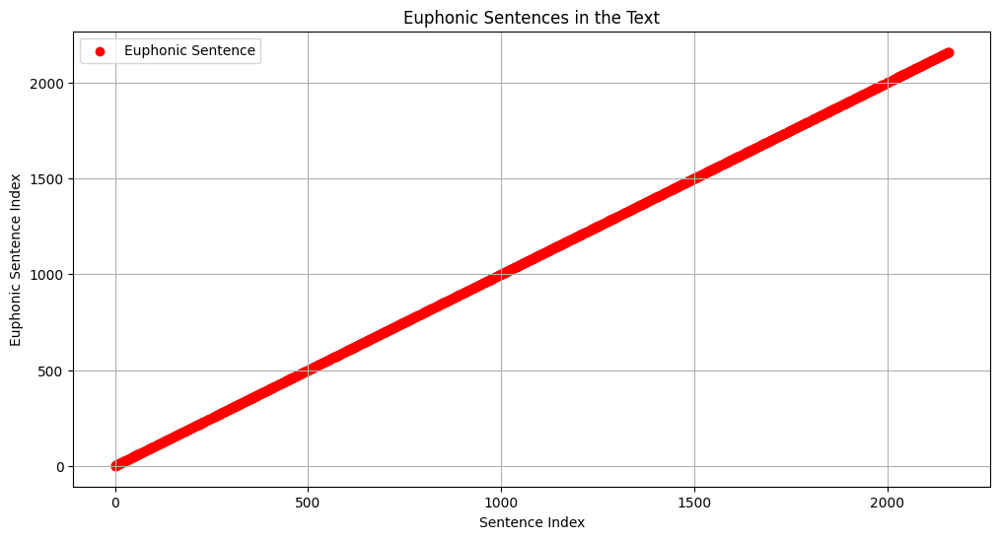

In [ ]:
def plot_euphonic_sentences(euphonic_indices):
    plt.figure(figsize=(12, 6))
    plt.scatter(euphonic_indices, euphonic_indices, color='red', label='Euphonic Sentence')
    plt.xlabel('Sentence Index')
    plt.ylabel('Euphonic Sentence Index')
    plt.title('Euphonic Sentences in the Text')
    plt.legend()
    plt.grid(True)
    plt.show()

plot_euphonic_sentences(euphonic_sentences)


## Aliteration detection

In [ ]:
nltk.download('cmudict')
cmu_dict = cmudict.dict()


# Function to get the first phoneme of a word
def get_initial_sound(word):
    try:
        phonemes = cmu_dict[word.lower()][0]
        # Return the first phoneme that is a consonant
        for phoneme in phonemes:
            if phoneme[0].isalpha() and phoneme[0].lower() not in 'aeiou':
                return phoneme
    except KeyError:
        return None  # Word not found in CMU dictionary

# Function to detect alliteration
def detect_alliteration(sentences):
    alliteration = defaultdict(list)

    for i, sentence in enumerate(sentences):
        words = [word.lower() for word in word_tokenize(sentence.lstrip('—_-_—').rstrip('—_-_—')) if word.isalpha()]
        initial_sounds = defaultdict(list)

        for word in words:
            initial_sound = get_initial_sound(word)
            if initial_sound:
                initial_sounds[initial_sound].append(word)

        for sound, word_list in initial_sounds.items():
            if len(word_list) > 1:
                alliteration[tuple(sorted(word_list))].append(i)

    return alliteration

[nltk_data] Downloading package cmudict to /root/nltk_data...
[nltk_data]   Package cmudict is already up-to-date!


In [ ]:
# Function to plot alliteration with counts
def plot_alliteration(alliteration, sentences):
    fig, ax = plt.subplots(figsize=(20, 30))

    y_labels = []
    colors = plt.cm.tab20.colors  # Color map for variety
    y_positions = range(len(alliteration))

    for i, (words, indices) in enumerate(alliteration.items()):
        phrase = ', '.join(words)
        y_labels.append(f"{phrase} (Count: {len(indices)})")
        color = colors[i % len(colors)]
        ax.plot(indices, [i] * len(indices), 'o', linestyle='None', color=color)  # Plot only markers

    ax.set_yticks(y_positions)
    ax.set_yticklabels(y_labels)
    ax.set_xlabel('Sentence Index')
    ax.set_title('Detected Alliteration in Text with Count')
    plt.grid(True)
    plt.tight_layout()
    plt.show()

# Function to create a vertical bar plot of alliteration and their counts
def plot_alliteration_count(alliteration):
    phrases = [' , '.join(words) for words in alliteration.keys()]
    counts = [len(indices) for indices in alliteration.values()]

    fig, ax = plt.subplots(figsize=(20, 30))
    bars = ax.barh(phrases, counts, color='lightgreen')  # Change to horizontal bar plot

    # Add text labels to bars
    for bar in bars:
        width = bar.get_width()
        ax.text(width, bar.get_y() + bar.get_height() / 2, f'{width}', ha='left', va='center')

    ax.set_xlabel('Count')
    ax.set_title('Count of Detected Alliteration')
    plt.tight_layout()
    plt.show()

In [ ]:
alliterations = detect_alliteration(sentences)

In [ ]:
print("ALLITERATION:")
for words, indices in alliterations.items():
    print(f"  {', '.join(words)}: {indices}")
print("\n")

ALLITERATION:
  bronze, by: [0, 164, 453, 759, 956, 1462, 1667]
  chips, chips, chips: [2]
  bloom, blue: [7, 322]
  rose, rose: [9, 547, 2120]
  of, of: [9, 220, 367, 388, 396, 512, 702, 962, 1089, 1146, 1550, 1831, 2002, 2041, 2043, 2076, 2120]
  trilling, trilling: [10]
  and, and: [14, 69, 547, 559, 847, 1507]
  bright, but: [18]
  answer, notes: [19]
  jingle, jingle: [23]
  chords, crashing: [37]
  all, lost: [46, 892, 907, 927, 937, 1244, 1833, 2058]
  bald, brought: [62, 1258]
  pad, pat, up: [62]
  far, far: [63]
  sad, so: [64, 385, 1371]
  no, no, not: [74]
  with, with: [75, 177, 1089, 1118, 1835]
  carra, cock: [75, 97, 1835]
  do, do: [78, 1568]
  wait, wait, while: [79, 1435, 1593]
  hee, hee: [80, 1428]
  wait, while: [81]
  tiny, tremulous: [87]
  bronze, by, by: [94, 714]
  one, one, with, with: [97]
  people, pray: [99]
  alone, last, left: [103]
  sad, so, summer: [103]
  wee, wind: [105, 1972]
  cow, ker: [107]
  de, doll: [107]
  will, with: [110, 2130]
  afar, fr

In [ ]:
print(alliterations[('bachelor', 'bachelor', 'blazes', 'bounding', 'boylan', 'boylan', 'by')])

[721]


In [ ]:
curr_sentence = sentences[721].replace("\n", " ")
for key in ('bachelor', 'bachelor', 'blazes', 'bounding', 'boylan', 'boylan', 'by'):
  word_regex = r'\b' + re.escape(key) + r'\b'  # '^' asserts position at start of the string
  curr_sentence = re.sub(word_regex, f"<span style='color: red;'>{key}</span>", curr_sentence, flags=re.IGNORECASE)

display(HTML(curr_sentence))  # Use print(sentence) if not in a Jupyter environment

curr_sentence = sentences[967].replace("\n", " ")
for key in ('sang', 'seemed', 'sorrow', 'still', 'still', 'strings'):
  word_regex = r'\b' + re.escape(key) + r'\b'  # '^' asserts position at start of the string
  curr_sentence = re.sub(word_regex, f"<span style='color: red;'>{key}</span>", curr_sentence.lstrip('—_-_—').rstrip('—_-_—'), flags=re.IGNORECASE)

display(HTML(curr_sentence))  # Use print(sentence) if not in a Jupyter environment

In [ ]:
print(alliterations)

defaultdict(<class 'list'>, {('bronze', 'by'): [0, 164, 453, 759, 956, 1462, 1667], ('chips', 'chips', 'chips'): [2], ('bloom', 'blue'): [7, 322], ('rose', 'rose'): [9, 547, 2120], ('of', 'of'): [9, 220, 367, 388, 396, 512, 702, 962, 1089, 1146, 1550, 1831, 2002, 2041, 2043, 2076, 2120], ('trilling', 'trilling'): [10], ('and', 'and'): [14, 69, 547, 559, 847, 1507], ('bright', 'but'): [18], ('answer', 'notes'): [19], ('jingle', 'jingle'): [23], ('chords', 'crashing'): [37], ('all', 'lost'): [46, 892, 907, 927, 937, 1244, 1833, 2058], ('bald', 'brought'): [62, 1258], ('pad', 'pat', 'up'): [62], ('far', 'far'): [63], ('sad', 'so'): [64, 385, 1371], ('no', 'no', 'not'): [74], ('with', 'with'): [75, 177, 1089, 1118, 1835], ('carra', 'cock'): [75, 97, 1835], ('do', 'do'): [78, 1568], ('wait', 'wait', 'while'): [79, 1435, 1593], ('hee', 'hee'): [80, 1428], ('wait', 'while'): [81], ('tiny', 'tremulous'): [87], ('bronze', 'by', 'by'): [94, 714], ('one', 'one', 'with', 'with'): [97], ('people', 

In [ ]:
print("Number of alliterations =", len(alliterations))

Number of alliterations = 1413


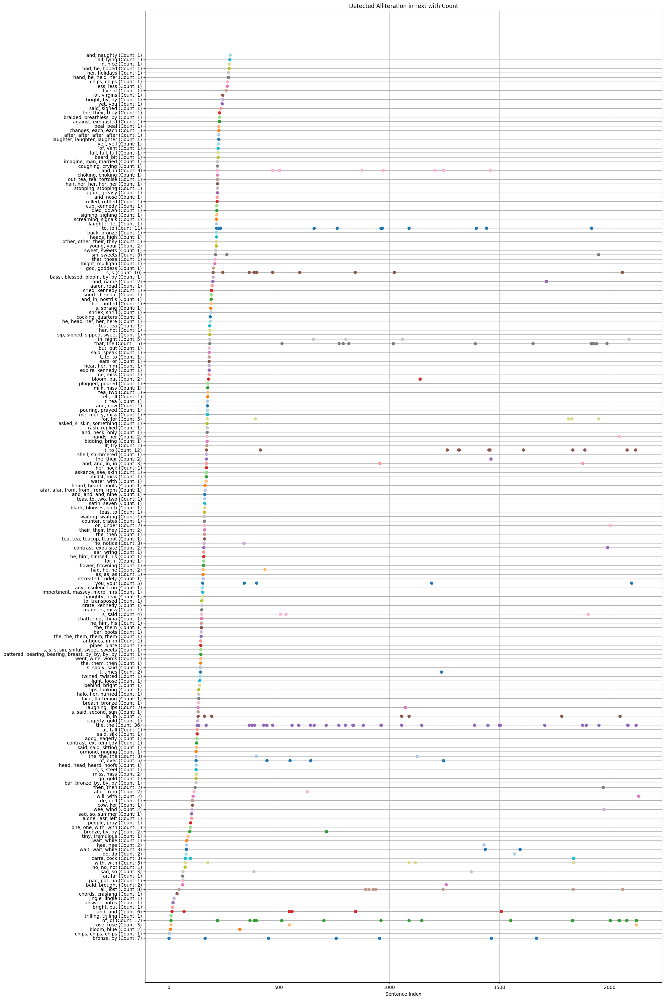

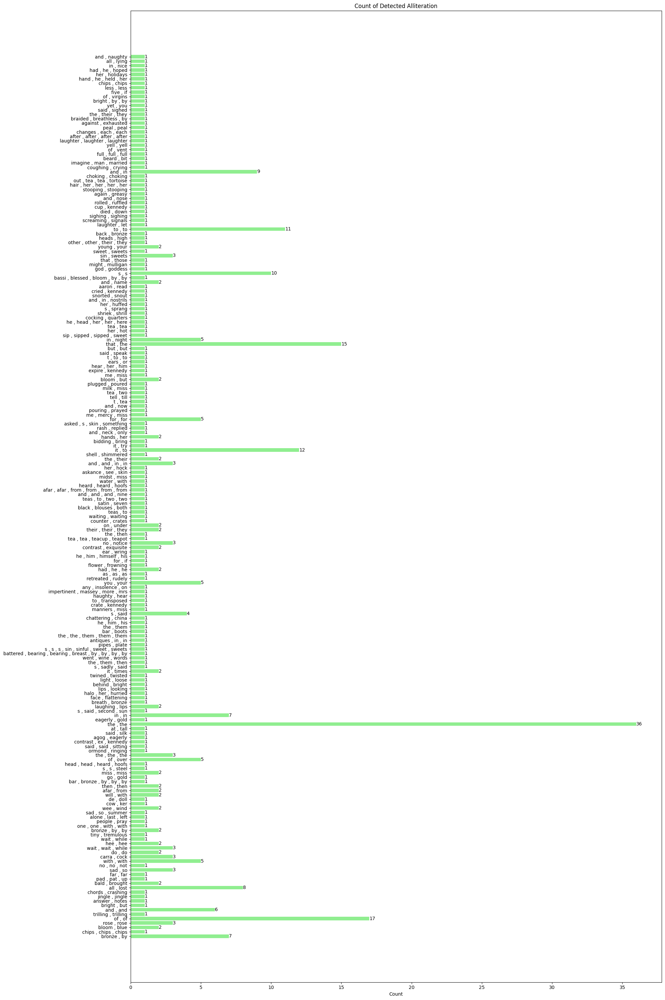

In [ ]:
alliterations_sub = dict(list(alliterations.items())[:200])

# Plot the alliteration results with counts
plot_alliteration(alliterations_sub, sentences)

# Plot the vertical bar chart of alliteration counts
plot_alliteration_count(alliterations_sub)

## Consonance detection

In [ ]:
# Ensure NLTK resources are downloaded
nltk.download('cmudict')
nltk.download('punkt')
cmu_dict = cmudict.dict()

# Function to extract consonant sounds from a word
def get_consonant_sounds(word):
    try:
        phonemes = cmu_dict[word.lower()][0]
        consonant_sounds = [phoneme for phoneme in phonemes if phoneme[0].lower() not in 'aeiou']
        return consonant_sounds
    except KeyError:
        return []

# Function to detect consonance
def detect_consonance(sentences):
    consonance = defaultdict(list)
    common_suffixes = {'ing', 'ed', 'es', 's'}  # Common suffixes to exclude

    for i, sentence in enumerate(sentences):
        words = [word.lower() for word in word_tokenize(sentence.lstrip('—_-_—').rstrip('—_-_—')) if word.isalpha()]
        consonant_sounds = defaultdict(list)

        for word in words:
            # Exclude words ending in common suffixes
            if any(word.endswith(suffix) for suffix in common_suffixes):
                continue

            sounds = get_consonant_sounds(word)
            for sound in sounds:
                consonant_sounds[sound].append(word)

        # Filter out trivial consonance detections
        for sound, word_list in consonant_sounds.items():
            if len(set(word_list)) > 1:  # Ensure more than one distinct word
                consonance[tuple(sorted(set(word_list)))].append(i)

    return consonance

[nltk_data] Downloading package cmudict to /root/nltk_data...
[nltk_data]   Package cmudict is already up-to-date!
[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Package punkt is already up-to-date!


In [ ]:
# Function to plot consonance with counts
def plot_consonance(consonance, sentences):
    fig, ax = plt.subplots(figsize=(20, 30))

    y_labels = []
    colors = plt.cm.tab20.colors  # Color map for variety
    y_positions = range(len(consonance))

    for i, (words, indices) in enumerate(consonance.items()):
        phrase = ', '.join(words)
        y_labels.append(f"{phrase} (Count: {len(indices)})")
        color = colors[i % len(colors)]
        ax.plot(indices, [i] * len(indices), 'o', linestyle='None', color=color)  # Plot only markers

    ax.set_yticks(y_positions)
    ax.set_yticklabels(y_labels)
    ax.set_xlabel('Sentence Index')
    ax.set_title('Detected Consonance in Text with Count')
    plt.grid(True)
    plt.tight_layout()
    plt.show()

# Function to create a horizontal bar plot of consonance and their counts
def plot_consonance_count(consonance):
    phrases = [' , '.join(words) for words in consonance.keys()]
    counts = [len(indices) for indices in consonance.values()]

    fig, ax = plt.subplots(figsize=(20, 30))
    bars = ax.barh(phrases, counts, color='lightblue')  # Change to horizontal bar plot

    # Add text labels to bars
    for bar in bars:
        width = bar.get_width()
        ax.text(width, bar.get_y() + bar.get_height() / 2, f'{width}', ha='left', va='center')

    ax.set_xlabel('Count')
    ax.set_title('Count of Detected Consonance')
    plt.tight_layout()
    plt.show()

In [ ]:
consonances = detect_consonance(sentences)

In [ ]:
print("Number of consonances =", len(consonances))

Number of consonances = 2652


In [ ]:
# Output the results for consonance
print("CONSONANCE:")
for words, indices in consonances.items():
    print(f"  {', '.join(words)}: {indices}")
print("\n")


CONSONANCE:
  bronze, by: [0, 94, 164, 453, 628, 714, 759, 956, 1462, 1667]
  gold, heard: [0, 759]
  and, gold: [4, 1457]
  bloom, blue: [7, 7, 322, 322]
  breast, rose: [9]
  on, satin: [9]
  breast, satin: [9, 9]
  pity, to: [13, 387]
  bronze, in: [13, 94, 195, 227]
  call, long: [14]
  bright, but: [18, 18]
  garter, rebound: [28]
  all, lost: [46, 907, 927, 937, 1833, 2058]
  first, saw: [49, 959, 1079, 2083]
  bald, deaf, pad: [62, 1258]
  deaf, knife: [62]
  bald, brought: [62, 1258]
  pad, pat, up: [62]
  brought, pat, took: [62]
  sad, so: [64, 1371]
  and, cold: [67]
  and, silent: [69]
  for, roar: [69]
  no, not: [74, 1334]
  carra, cock: [75, 97, 1835]
  wait, while: [79, 81, 1427, 1431, 1435, 1593]
  but, wait: [82, 1594]
  low, middle: [83]
  dark, middle: [83, 1599]
  all, fallen: [86, 1709]
  gold, shadow: [94]
  bloom, old: [96, 321]
  one, with: [97, 1184, 1560]
  for, pray: [98, 1881]
  people, pray: [99]
  alone, bloom, feel, last, left: [103]
  last, sad, so, sum

In [ ]:
print(sentences[968])

Good, good to hear: sorrow from them each
seemed to from both depart when first they heard.


In [ ]:
curr_sentence = sentences[832].replace("\n", " ")
for key in ('dusty', 'last', 'sail', 'sang', 'softly'):
  word_regex = r'\b' + re.escape(key) + r'\b'  # '^' asserts position at start of the string
  curr_sentence = re.sub(word_regex, f"<span style='color: red;'>{key}</span>", curr_sentence, flags=re.IGNORECASE)

display(HTML(curr_sentence))  # Use print(sentence) if not in a Jupyter environment

curr_sentence = sentences[848].replace("\n", " ")
for key in ('beautiful', 'most', 'night', 'tenor', 'that', 'written'):
  word_regex = r'\b' + re.escape(key) + r'\b'  # '^' asserts position at start of the string
  curr_sentence = re.sub(word_regex, f"<span style='color: red;'>{key}</span>", curr_sentence.lstrip('—_-_—').rstrip('—_-_—'), flags=re.IGNORECASE)

display(HTML(curr_sentence))  # Use print(sentence) if not in a Jupyter environment

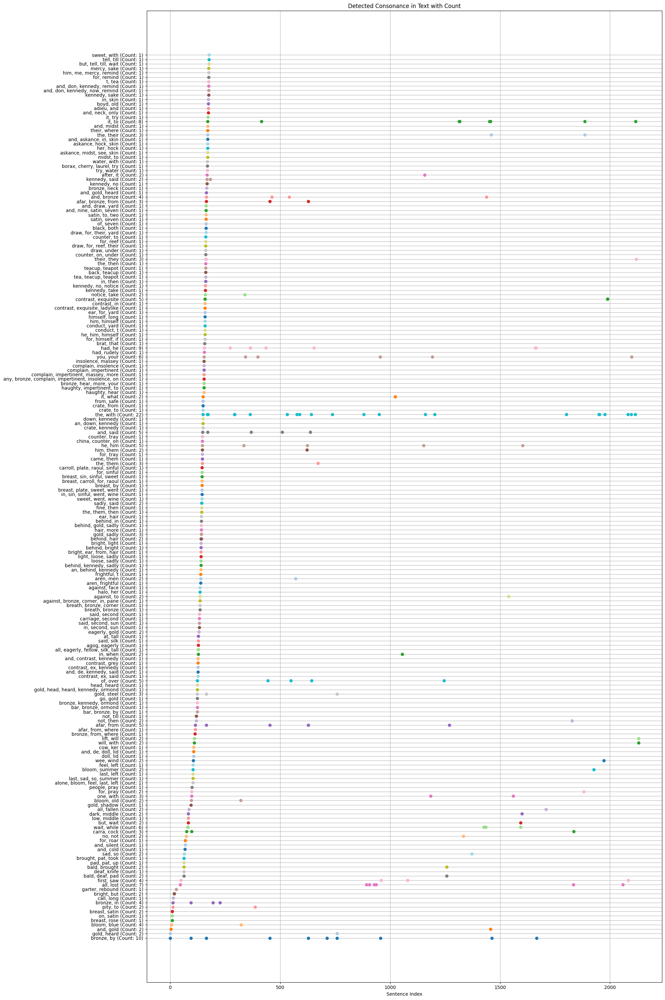

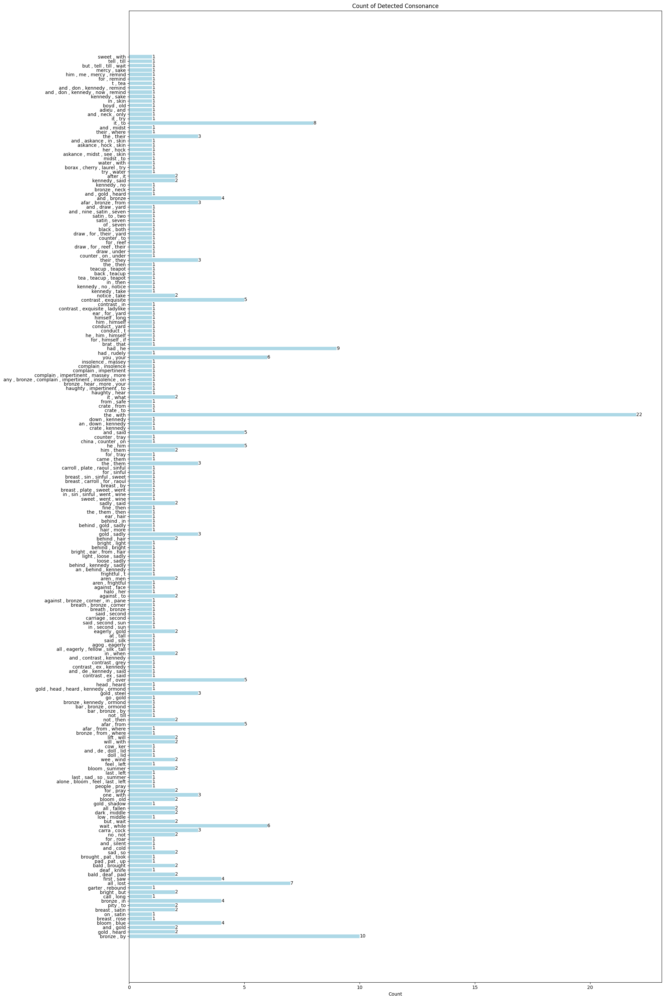

In [ ]:
consonances_sub = dict(list(consonances.items())[:200])

# Plot the alliteration results with counts
plot_consonance(consonances_sub, sentences)

# Plot the vertical bar chart of alliteration counts
plot_consonance_count(consonances_sub)

## Assonance detection

In [ ]:
nltk.download('cmudict')
nltk.download('punkt')

# Load CMU Pronouncing Dictionary
cmu_dict = cmudict.dict()

# Function to extract vowel sounds from a word
def get_vowel_sounds(word):
    try:
        phonemes = cmu_dict[word.lower()][0]
        vowel_sounds = [phoneme for phoneme in phonemes if phoneme[0].lower() in 'aeiou']
        return vowel_sounds
    except KeyError:
        return []

# Function to detect assonance with refined criteria
def detect_assonance(sentences):
    assonance = defaultdict(list)
    minimal_length = 2  # Minimal length of vowel sounds to consider

    for i, sentence in enumerate(sentences):
        words = [word.lower() for word in word_tokenize(sentence.lstrip('—_-_—').rstrip('—_-_—')) if word.isalpha()]
        vowel_sounds = defaultdict(list)

        for word in words:
            sounds = get_vowel_sounds(word)
            for sound in sounds:
                if len(sound) >= minimal_length:  # Consider only meaningful vowel sounds
                    vowel_sounds[sound].append(word)

        # Filter out trivial assonance detections
        for sound, word_list in vowel_sounds.items():
            unique_words = set(word_list)
            if len(unique_words) > 1 and sound:  # Ensure more than one distinct word and non-empty sound
                assonance[tuple(sorted(unique_words))].append(i)

    return assonance

[nltk_data] Downloading package cmudict to /root/nltk_data...
[nltk_data]   Package cmudict is already up-to-date!
[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Package punkt is already up-to-date!


In [ ]:
# Function to plot assonance with counts
def plot_assonance(assonance, sentences):
    fig, ax = plt.subplots(figsize=(12, 8))

    y_labels = []
    colors = plt.cm.tab20.colors  # Color map for variety
    y_positions = range(len(assonance))

    for i, (words, indices) in enumerate(assonance.items()):
        phrase = ', '.join(words)
        y_labels.append(f"{phrase} (Count: {len(indices)})")
        color = colors[i % len(colors)]
        ax.plot(indices, [i] * len(indices), 'o', linestyle='None', color=color)  # Plot only markers

    ax.set_yticks(y_positions)
    ax.set_yticklabels(y_labels)
    ax.set_xlabel('Sentence Index')
    ax.set_title('Detected Assonance in Text with Count')
    plt.grid(True)
    plt.tight_layout()
    plt.show()

# Function to create a horizontal bar plot of assonance and their counts
def plot_assonance_bar(assonance):
    phrases = [' , '.join(words) for words in assonance.keys()]
    counts = [len(indices) for indices in assonance.values()]

    fig, ax = plt.subplots(figsize=(14, 8))
    bars = ax.barh(phrases, counts, color='lightcoral')  # Change to horizontal bar plot

    # Add text labels to bars
    for bar in bars:
        width = bar.get_width()
        ax.text(width, bar.get_y() + bar.get_height() / 2, f'{width}', ha='left', va='center')

    ax.set_xlabel('Count')
    ax.set_title('Count of Detected Assonance')
    plt.tight_layout()
    plt.show()

In [ ]:
assonances = detect_assonance(sentences)

In [ ]:
print("Number of assonances =", len(assonances))

Number of assonances = 2115


In [ ]:
print("ASSONANCE:")
for words, indices in assonances.items():
    print(f"  {', '.join(words)}: {indices}")
print("\n")

ASSONANCE:
  chips, picking: [2]
  bloom, blue: [7, 322]
  a, satin: [9, 493]
  jumping, of: [9]
  a, and: [14, 399, 466, 1207, 1924, 2044]
  call, long: [14, 434]
  o, rose: [20, 1822]
  leave, thee: [29]
  the, tympanum: [41]
  a, the, upon: [43, 832, 834]
  veil, waves: [43]
  all, lost: [46, 892, 907, 927, 937, 2058]
  bald, brought: [62, 1258]
  pad, pat: [62, 1375]
  lonely, so: [65, 1373, 2085]
  and, the: [67, 295, 454, 882, 950, 1160, 1440, 1457, 1474, 1664, 1753]
  spiked, winding: [67]
  and, silent: [69]
  for, roar: [69]
  a, carra: [75, 97, 1835]
  carra, cock: [75, 97, 1835]
  he, preacher: [85]
  all, gone: [85, 1708]
  a, baton: [92]
  cool, protruding: [92]
  rapped, tapped: [97, 1560]
  fingers, his: [100]
  last, sad: [103]
  alone, rose, so: [103]
  of, summer: [103, 1927]
  piped, wind: [105, 1972]
  lift, will, with: [110, 2130]
  bar, bronze: [124]
  go, gold, over: [124]
  miss, ringing: [124]
  head, kennedy, s: [124]
  kennedy, ormond, the: [124]
  his, miss,

In [ ]:
print(sentences[145])

Bloowho went by by Moulang’s pipes bearing in his breast the sweets of
sin, by Wine’s antiques, in memory bearing sweet sinful words, by
Carroll’s dusky battered plate, for Raoul.


In [ ]:
curr_sentence = sentences[2121].replace("\n", " ")
for key in ('big', 'fifth', 'lid'):
  word_regex = r'\b' + re.escape(key) + r'\b'  # '^' asserts position at start of the string
  curr_sentence = re.sub(word_regex, f"<span style='color: red;'>{key}</span>", curr_sentence, flags=re.IGNORECASE)

display(HTML(curr_sentence))  # Use print(sentence) if not in a Jupyter environment

curr_sentence = sentences[2121].replace("\n", " ")
for key in ('bob', 'doll', 'dollard'):
  word_regex = r'\b' + re.escape(key) + r'\b'  # '^' asserts position at start of the string
  curr_sentence = re.sub(word_regex, f"<span style='color: red;'>{key}</span>", curr_sentence.lstrip('—_-_—').rstrip('—_-_—'), flags=re.IGNORECASE)

display(HTML(curr_sentence))  # Use print(sentence) if not in a Jupyter environment

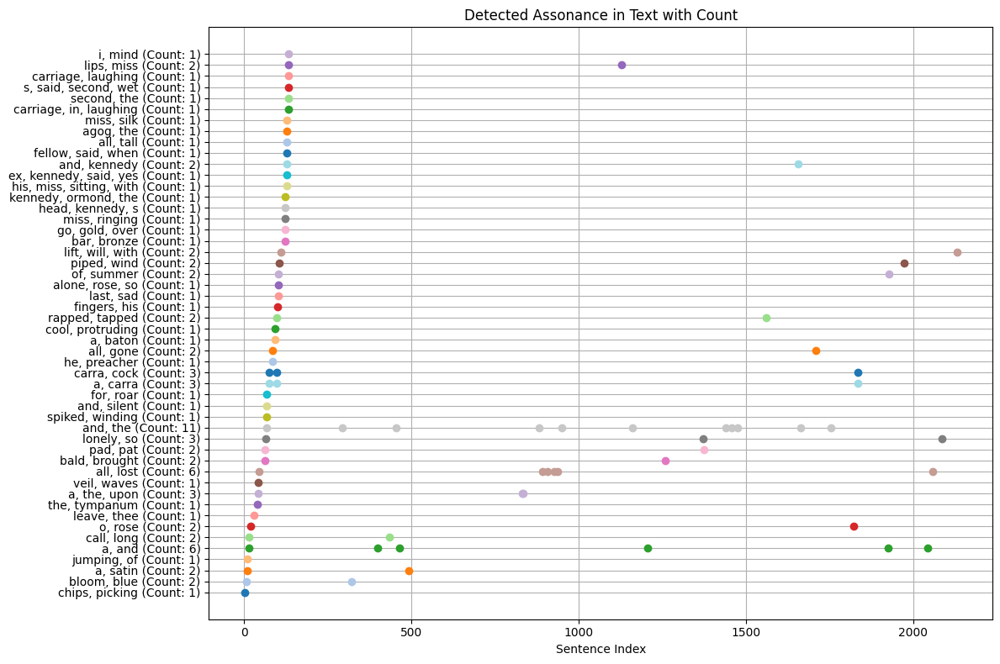

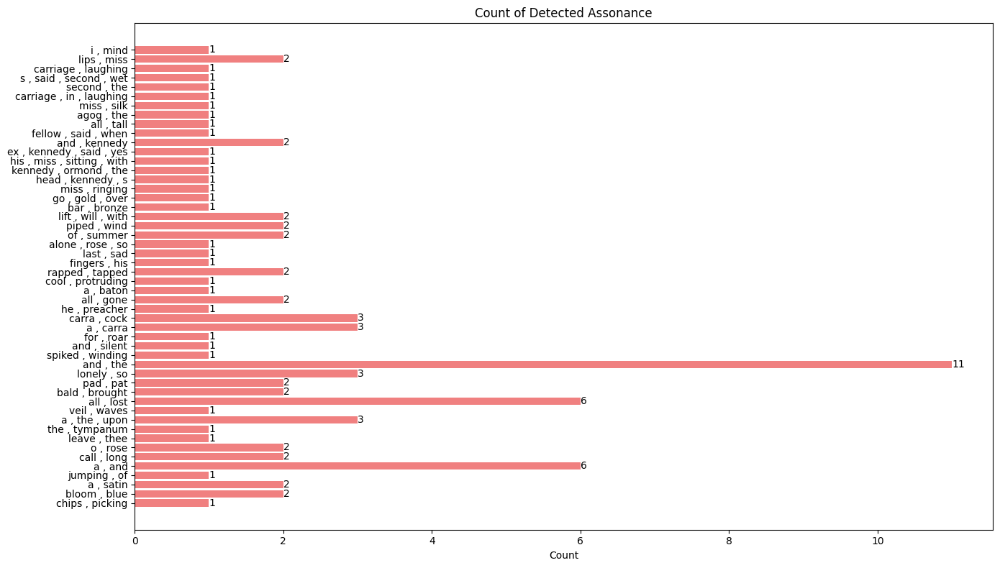

In [ ]:
assonances_sub = dict(list(assonances.items())[:50])

# Plot the asonance results with counts
plot_assonance(assonances_sub, sentences)

# Plot the vertical bar chart of alliteration counts
plot_assonance_bar(assonances_sub)

## Sibilance detection

In [ ]:
# Ensure NLTK resources are downloaded
nltk.download('cmudict')
nltk.download('punkt')
cmu_dict = cmudict.dict()

# List of sibilant sounds
sibilant_sounds = {'s', 'sh', 'z', 'ch', 'x'}

# Function to extract sibilant sounds from a word
def get_sibilant_sounds(word):
    try:
        phonemes = cmu_dict[word.lower()][0]
        sibilant_sounds_in_word = [phoneme for phoneme in phonemes if phoneme.lower()[:2] in sibilant_sounds or phoneme.lower()[:1] in sibilant_sounds]
        return sibilant_sounds_in_word
    except KeyError:
        return []

# Function to detect sibilance
def detect_sibilance(sentences):
    sibilance = defaultdict(list)

    for i, sentence in enumerate(sentences):
        words = [word.lower() for word in word_tokenize(sentence.lstrip('—_-_—').rstrip('—_-_—')) if word.isalpha()]
        sibilant_sounds_dict = defaultdict(list)

        for word in words:
            sounds = get_sibilant_sounds(word)
            for sound in sounds:
                sibilant_sounds_dict[sound].append(word)

        # Filter out trivial sibilance detections
        for sound, word_list in sibilant_sounds_dict.items():
            unique_words = set(word_list)
            if len(unique_words) > 1:  # Ensure more than one distinct word
                sibilance[tuple(sorted(unique_words))].append(i)

    return sibilance

# Function to plot sibilance with counts
def plot_sibilance(sibilance, sentences):
    fig, ax = plt.subplots(figsize=(12, 8))

    y_labels = []
    colors = plt.cm.tab20.colors  # Color map for variety
    y_positions = range(len(sibilance))

    for i, (words, indices) in enumerate(sibilance.items()):
        phrase = ', '.join(words)
        y_labels.append(f"{phrase} (Count: {len(indices)})")
        color = colors[i % len(colors)]
        ax.plot(indices, [i] * len(indices), 'o', linestyle='None', color=color)  # Plot only markers

    ax.set_yticks(y_positions)
    ax.set_yticklabels(y_labels)
    ax.set_xlabel('Sentence Index')
    ax.set_title('Detected Sibilance in Text with Count')
    plt.grid(True)
    plt.tight_layout()
    plt.show()

[nltk_data] Downloading package cmudict to /root/nltk_data...
[nltk_data]   Package cmudict is already up-to-date!
[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Package punkt is already up-to-date!


In [ ]:
# Function to plot sibilance with counts
def plot_sibilance(sibilance, sentences):
    fig, ax = plt.subplots(figsize=(15, 25))

    y_labels = []
    colors = plt.cm.tab20.colors  # Color map for variety
    y_positions = range(len(sibilance))

    for i, (words, indices) in enumerate(sibilance.items()):
        phrase = ', '.join(words)
        y_labels.append(f"{phrase} (Count: {len(indices)})")
        color = colors[i % len(colors)]
        ax.plot(indices, [i] * len(indices), 'o', linestyle='None', color=color)  # Plot only markers

    ax.set_yticks(y_positions)
    ax.set_yticklabels(y_labels)
    ax.set_xlabel('Sentence Index')
    ax.set_title('Detected Sibilance in Text with Count')
    plt.grid(True)
    plt.tight_layout()
    plt.show()

# Function to create a horizontal bar plot of sibilance and their counts
def plot_sibilance_count(sibilance):
    phrases = [' , '.join(words) for words in sibilance.keys()]
    counts = [len(indices) for indices in sibilance.values()]

    fig, ax = plt.subplots(figsize=(15, 25))
    bars = ax.barh(phrases, counts, color='lightblue')  # Change to horizontal bar plot

    # Add text labels to bars
    for bar in bars:
        width = bar.get_width()
        ax.text(width, bar.get_y() + bar.get_height() / 2, f'{width}', ha='left', va='center')

    ax.set_xlabel('Count')
    ax.set_title('Count of Detected Sibilance')
    plt.tight_layout()
    plt.show()

In [ ]:
sibilances = detect_sibilance(sentences)

In [ ]:
print("Number of sibilances =", len(sibilances))

Number of sibilances = 591


In [ ]:
print("SIBILANCE:")
for words, indices in sibilances.items():
    print(f"  {', '.join(words)}: {indices}")
print("\n")

SIBILANCE:
  breast, satin: [9]
  answer, notes: [19]
  first, saw: [49, 959, 1079, 2083]
  sad, so: [64, 1371]
  liszt, s: [71, 1551]
  fingers, his: [100]
  last, sad, so, summer: [103]
  hoofs, miss, s, steel: [124]
  asked, miss: [126]
  contrast, ex, miss, said, sitting, yes: [127]
  miss, said, silk: [128]
  lips, miss, s, said, second, sun: [132]
  against, face: [135]
  lips, s: [136, 546]
  loose, miss, sadly: [140]
  sadly, twisted: [141]
  s, sadly, said: [143]
  has, times: [143]
  antiques, breast, pipes, s, sin, sinful, sweet, sweets: [145]
  his, words: [145]
  chattering, china: [147]
  s, said: [148, 505, 531]
  miss, safe, transposed: [149]
  eyes, manners, transposed: [149]
  asked, boots: [151]
  bronze, mrs: [154]
  insolence, massey, mrs: [154]
  miss, said: [157, 167, 187, 323]
  contrast, exquisite: [159, 1989]
  miss, notice: [160]
  blouses, satin, seven: [163]
  blouses, teas: [163]
  hoofs, steel, yes: [164]
  askance, glasses, midst, miss, see, skin: [170]


In [ ]:
curr_sentence = sentences[2001].replace("\n", " ")
for key in ('headless', 'mr', 'said', 'sardine', 'staring'):
  word_regex = r'\b' + re.escape(key) + r'\b'  # '^' asserts position at start of the string
  curr_sentence = re.sub(word_regex, f"<span style='color: red;'>{key}</span>", curr_sentence.lstrip('—_-_—').rstrip('—_-_—'), flags=re.IGNORECASE)

display(HTML(curr_sentence))  # Use print(sentence) if not in a Jupyter environment

curr_sentence = sentences[2041].replace("\n", " ")
for key in ('coolest', 's', 'see', 'streaming', 'stripling'):
  word_regex = r'\b' + re.escape(key) + r'\b'  # '^' asserts position at start of the string
  curr_sentence = re.sub(word_regex, f"<span style='color: red;'>{key}</span>", curr_sentence.lstrip('—_-_—').rstrip('—_-_—'), flags=re.IGNORECASE)

display(HTML(curr_sentence))  # Use print(sentence) if not in a Jupyter environment

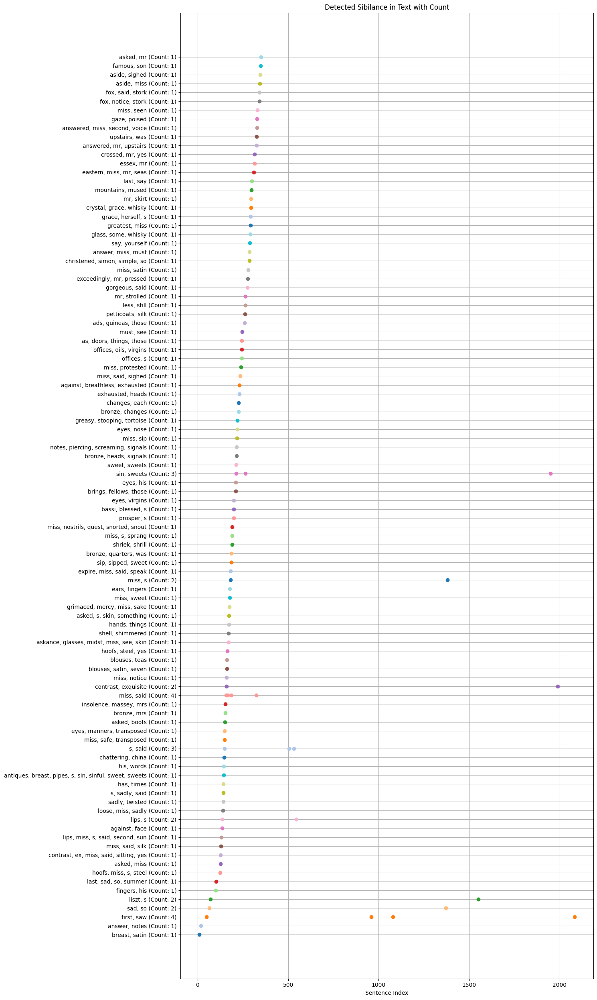

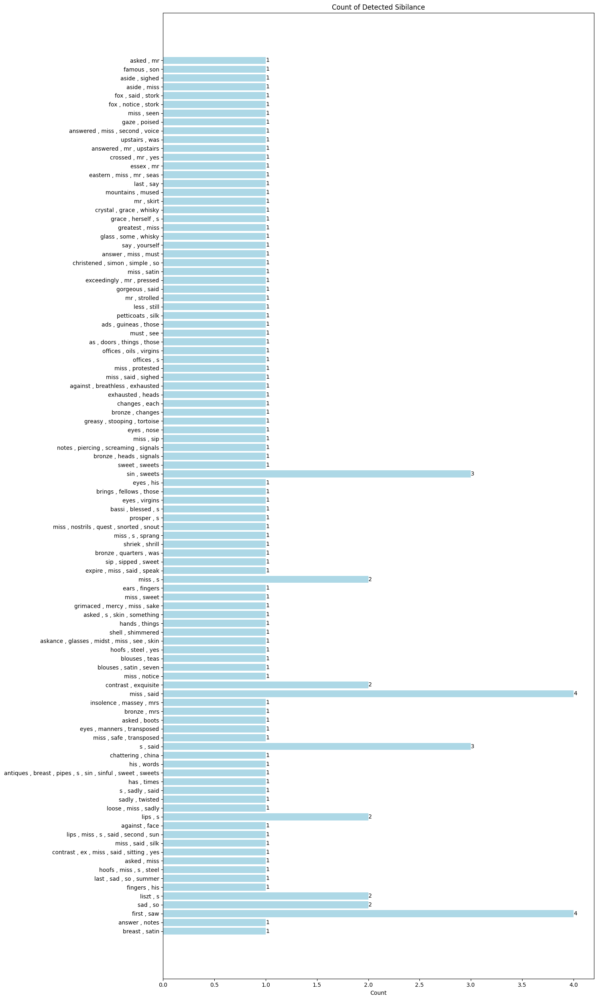

In [ ]:
sibilances_sub = dict(list(sibilances.items())[:100])

# Plot the sibilance results with counts
plot_sibilance(sibilances_sub, sentences)

# Plot the horizontal bar chart of sibilance counts
plot_sibilance_count(sibilances_sub)

## Polyphonic analysis

In [4]:
words = [word_tokenize(sentence) for sentence in sentences]
words = [[word.lower() for word in word_list if word.isalpha()] for word_list in words]
# Remove stop words
stop_words = set(stopwords.words('english'))
words = [[word for word in word_list if word not in stop_words] for word_list in words]

In [6]:
nlp = spacy.load("en_core_web_sm")
doc = nlp(text)
pos_tags = [(token.text, token.pos_) for token in doc]
entities = [(entity.text, entity.label_) for entity in doc.ents]

In [17]:
print("POS Tags:", pos_tags)
print("Named Entities:", entities)

POS Tags: [('Bronze', 'NOUN'), ('by', 'ADP'), ('gold', 'NOUN'), ('heard', 'VERB'), ('the', 'DET'), ('hoofirons', 'NOUN'), (',', 'PUNCT'), ('steelyringing', 'VERB'), ('.', 'PUNCT'), ('\n\n', 'SPACE'), ('Imperthnthn', 'PROPN'), ('thnthnthn', 'NOUN'), ('.', 'PUNCT'), ('\n\n', 'SPACE'), ('Chips', 'NOUN'), (',', 'PUNCT'), ('picking', 'VERB'), ('chips', 'NOUN'), ('off', 'ADP'), ('rocky', 'ADJ'), ('thumbnail', 'PROPN'), (',', 'PUNCT'), ('chips', 'NOUN'), ('.', 'PUNCT'), ('\n\n', 'SPACE'), ('Horrid', 'PROPN'), ('!', 'PUNCT'), ('And', 'CCONJ'), ('gold', 'NOUN'), ('flushed', 'VERB'), ('more', 'ADV'), ('.', 'PUNCT'), ('\n\n', 'SPACE'), ('A', 'DET'), ('husky', 'ADJ'), ('fifenote', 'NOUN'), ('blew', 'VERB'), ('.', 'PUNCT'), ('\n\n', 'SPACE'), ('Blew', 'PROPN'), ('.', 'PUNCT'), ('Blue', 'ADJ'), ('bloom', 'NOUN'), ('is', 'AUX'), ('on', 'ADP'), ('the', 'PRON'), ('.', 'PUNCT'), ('\n\n', 'SPACE'), ('Goldpinnacled', 'VERB'), ('hair', 'NOUN'), ('.', 'PUNCT'), ('\n\n', 'SPACE'), ('A', 'DET'), ('jumping', '

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)
<ipython-input-37-2517c6ff938b>:11: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=list(pos_counts.keys()), y=list(pos_counts.values()), palette='viridis')


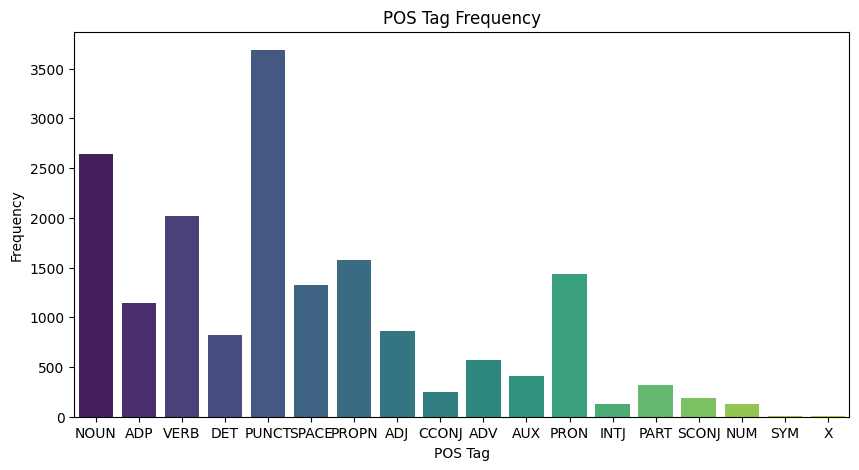

<ipython-input-37-2517c6ff938b>:19: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=list(entity_counts.keys()), y=list(entity_counts.values()), palette='viridis')


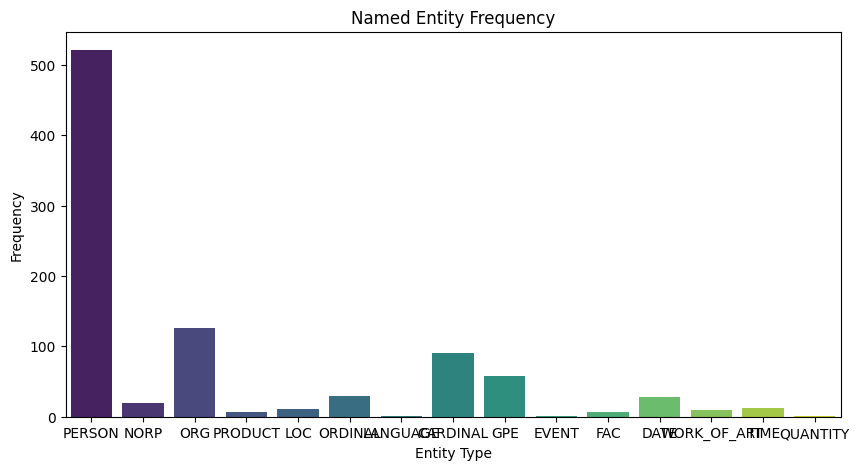

In [37]:
# Extract POS tags and named entities
pos_tags = [token.pos_ for token in doc]
entities = [entity.label_ for entity in doc.ents]

# Count POS tags and named entities
pos_counts = Counter(pos_tags)
entity_counts = Counter(entities)

# Plot POS tags
plt.figure(figsize=(10, 5))
sns.barplot(x=list(pos_counts.keys()), y=list(pos_counts.values()), palette='viridis')
plt.title("POS Tag Frequency")
plt.xlabel("POS Tag")
plt.ylabel("Frequency")
plt.show()

# Plot named entities
plt.figure(figsize=(10, 5))
sns.barplot(x=list(entity_counts.keys()), y=list(entity_counts.values()), palette='viridis')
plt.title("Named Entity Frequency")
plt.xlabel("Entity Type")
plt.ylabel("Frequency")
plt.show()


/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)
<ipython-input-39-403971d32430>:8: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=pos_distribution.index, y=pos_distribution.values, palette='viridis')


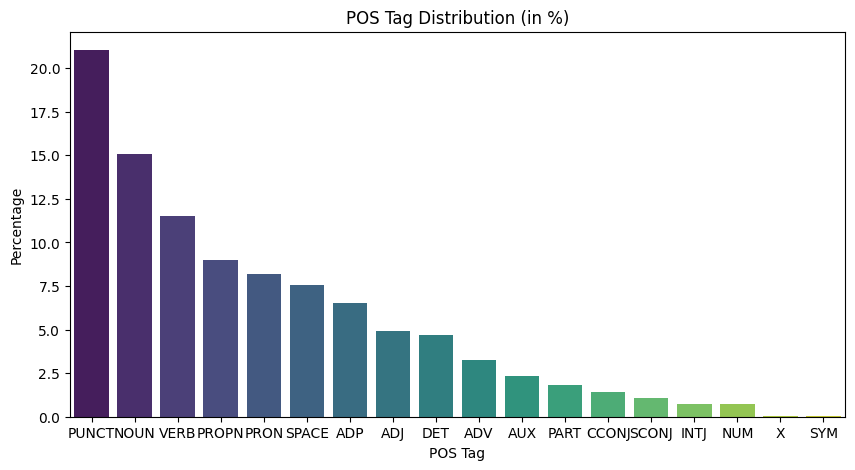

<ipython-input-39-403971d32430>:17: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=entity_distribution.index, y=entity_distribution.values, palette='viridis')


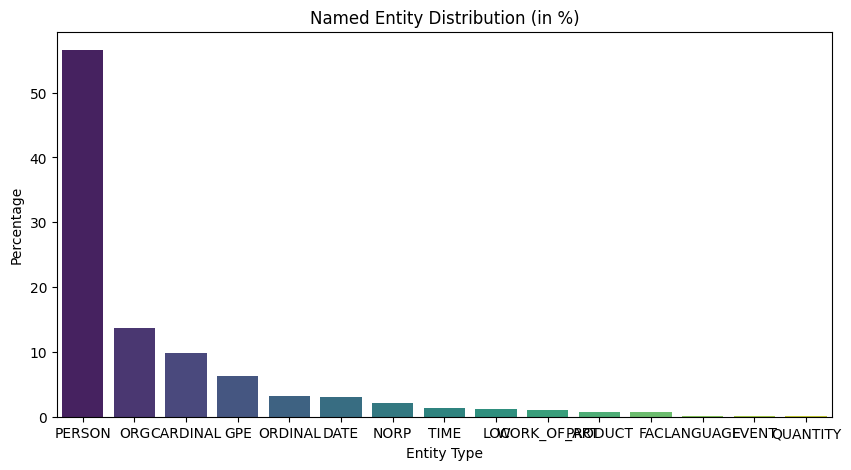

In [39]:
# Convert POS tags to DataFrame for further analysis
pos_df = pd.DataFrame(pos_tags, columns=["POS"])
entity_df = pd.DataFrame(entities, columns=["Entity"])

# Calculate and plot the distribution of POS tags in percentages
pos_distribution = pos_df['POS'].value_counts(normalize=True) * 100
plt.figure(figsize=(10, 5))
sns.barplot(x=pos_distribution.index, y=pos_distribution.values, palette='viridis')
plt.title("POS Tag Distribution (in %)")
plt.xlabel("POS Tag")
plt.ylabel("Percentage")
plt.show()

# Calculate and plot the distribution of named entities in percentages
entity_distribution = entity_df['Entity'].value_counts(normalize=True) * 100
plt.figure(figsize=(10, 5))
sns.barplot(x=entity_distribution.index, y=entity_distribution.values, palette='viridis')
plt.title("Named Entity Distribution (in %)")
plt.xlabel("Entity Type")
plt.ylabel("Percentage")
plt.show()

In [23]:
sentiments = [TextBlob(sentence).sentiment for sentence in sentences]
average_polarity = sum(sent.polarity for sent in sentiments) / len(sentiments)
average_subjectivity = sum(sent.subjectivity for sent in sentiments) / len(sentiments)
# Count sentiment categories
positive_sentences = sum(1 for sent in sentiments if sent.polarity > 0)
negative_sentences = sum(1 for sent in sentiments if sent.polarity < 0)
neutral_sentences = sum(1 for sent in sentiments if sent.polarity == 0)

In [24]:
# Print aggregate scores
print(f"Average Polarity: {average_polarity:.2f}")
print(f"Average Subjectivity: {average_subjectivity:.2f}")
print(f"Positive Sentences: {positive_sentences}")
print(f"Negative Sentences: {negative_sentences}")
print(f"Neutral Sentences: {neutral_sentences}")

Average Polarity: 0.04
Average Subjectivity: 0.16
Positive Sentences: 378
Negative Sentences: 227
Neutral Sentences: 1556


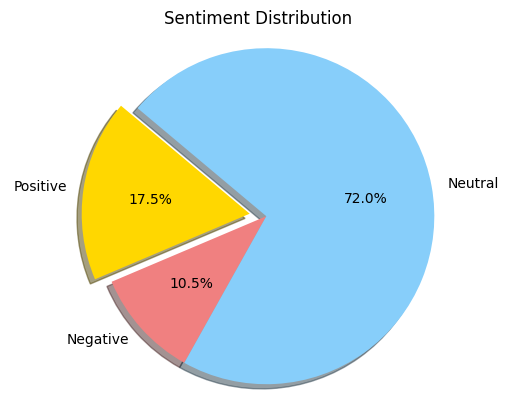

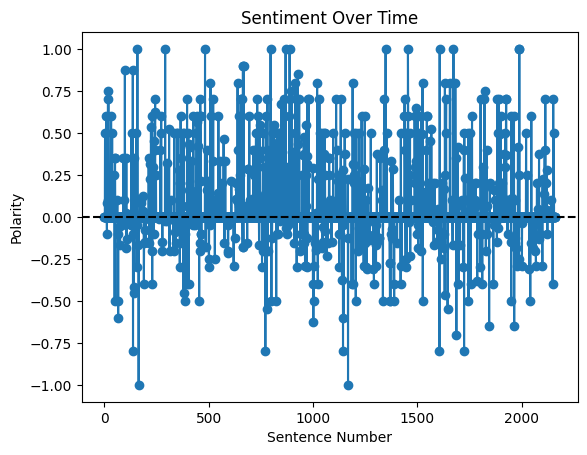

In [25]:
labels = 'Positive', 'Negative', 'Neutral'
sizes = [positive_sentences, negative_sentences, neutral_sentences]
colors = ['gold', 'lightcoral', 'lightskyblue']
explode = (0.1, 0, 0)

plt.pie(sizes, explode=explode, labels=labels, colors=colors,
autopct='%1.1f%%', shadow=True, startangle=140)

plt.axis('equal')
plt.title("Sentiment Distribution")
plt.show()

# Visualize sentiment over time
polarity_scores = [sent.polarity for sent in sentiments]
plt.plot(polarity_scores, marker='o')
plt.title("Sentiment Over Time")
plt.xlabel("Sentence Number")
plt.ylabel("Polarity")
plt.axhline(y=0, color='k', linestyle='--')
plt.show()

In [16]:
print("Sentiments:", sentiments)

Sentiments: [Sentiment(polarity=0.0, subjectivity=0.0), Sentiment(polarity=0.0, subjectivity=0.0), Sentiment(polarity=0.0, subjectivity=0.0), Sentiment(polarity=0.0, subjectivity=0.0), Sentiment(polarity=0.5, subjectivity=0.5), Sentiment(polarity=0.0, subjectivity=0.0), Sentiment(polarity=0.0, subjectivity=0.0), Sentiment(polarity=0.0, subjectivity=0.1), Sentiment(polarity=0.0, subjectivity=0.0), Sentiment(polarity=0.6, subjectivity=0.95), Sentiment(polarity=0.0, subjectivity=0.0), Sentiment(polarity=0.0, subjectivity=0.0), Sentiment(polarity=0.0, subjectivity=0.0), Sentiment(polarity=-0.1, subjectivity=0.2), Sentiment(polarity=0.08214285714285713, subjectivity=0.45), Sentiment(polarity=0.0, subjectivity=0.0), Sentiment(polarity=0.0, subjectivity=0.0), Sentiment(polarity=0.1, subjectivity=0.35), Sentiment(polarity=0.7000000000000001, subjectivity=0.7999999999999999), Sentiment(polarity=0.0, subjectivity=0.0), Sentiment(polarity=0.75, subjectivity=0.95), Sentiment(polarity=0.0, subjecti

In [41]:
dictionary = corpora.Dictionary(words)
corpus = [dictionary.doc2bow(word_list) for word_list in words]
lda = LdaModel(corpus, num_topics=5, id2word=dictionary, passes=15)

# Re-run the analysis and print topics
topics = lda.print_topics(num_words=4)
print("Refined Topics:")
for topic in topics:
    print(topic)

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


Refined Topics:
(0, '0.070*"tap" + 0.016*"wait" + 0.016*"chap" + 0.011*"horn"')
(1, '0.025*"hee" + 0.014*"march" + 0.014*"like" + 0.013*"little"')
(2, '0.024*"pom" + 0.015*"bloom" + 0.012*"ben" + 0.011*"lionel"')
(3, '0.019*"said" + 0.014*"miss" + 0.014*"mr" + 0.013*"must"')
(4, '0.029*"last" + 0.025*"one" + 0.017*"bronze" + 0.016*"well"')


In [32]:
# Visualize topics using pyLDAvis
vis_data = gensimvis.prepare(lda, corpus, dictionary)

# Save the visualization as an HTML file
pyLDAvis.save_html(vis_data, 'lda_vis.html')

# Display the visualization in Jupyter Notebook (if running in a Jupyter environment)
pyLDAvis.display(vis_data)

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


In [40]:
def analyze_text(text):
    words = preprocess_text(text)
    doc = nlp(text)
    pos_tags = [(token.text, token.pos_) for token in doc]
    entities = [(entity.text, entity.label_) for entity in doc.ents]
    sentiments = [TextBlob(sentence).sentiment for sentence in sent_tokenize(text)]
    dictionary = corpora.Dictionary(words)
    corpus = [dictionary.doc2bow(word_list) for word_list in words]
    lda = LdaModel(corpus, num_topics=5, id2word=dictionary, passes=15)

    # Re-run the analysis and print topics
    topics = lda.print_topics(num_words=4)

    return {
        "POS Tags": pos_tags,
        "Named Entities": entities,
        "Sentiments": sentiments,
        "Topics": topics
    }

analysis_result = analyze_text(text)
for key, value in analysis_result.items():
    print(f"{key}: {value}\n")


/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


POS Tags: [('Bronze', 'NOUN'), ('by', 'ADP'), ('gold', 'NOUN'), ('heard', 'VERB'), ('the', 'DET'), ('hoofirons', 'NOUN'), (',', 'PUNCT'), ('steelyringing', 'VERB'), ('.', 'PUNCT'), ('\n\n', 'SPACE'), ('Imperthnthn', 'PROPN'), ('thnthnthn', 'NOUN'), ('.', 'PUNCT'), ('\n\n', 'SPACE'), ('Chips', 'NOUN'), (',', 'PUNCT'), ('picking', 'VERB'), ('chips', 'NOUN'), ('off', 'ADP'), ('rocky', 'ADJ'), ('thumbnail', 'PROPN'), (',', 'PUNCT'), ('chips', 'NOUN'), ('.', 'PUNCT'), ('\n\n', 'SPACE'), ('Horrid', 'PROPN'), ('!', 'PUNCT'), ('And', 'CCONJ'), ('gold', 'NOUN'), ('flushed', 'VERB'), ('more', 'ADV'), ('.', 'PUNCT'), ('\n\n', 'SPACE'), ('A', 'DET'), ('husky', 'ADJ'), ('fifenote', 'NOUN'), ('blew', 'VERB'), ('.', 'PUNCT'), ('\n\n', 'SPACE'), ('Blew', 'PROPN'), ('.', 'PUNCT'), ('Blue', 'ADJ'), ('bloom', 'NOUN'), ('is', 'AUX'), ('on', 'ADP'), ('the', 'PRON'), ('.', 'PUNCT'), ('\n\n', 'SPACE'), ('Goldpinnacled', 'VERB'), ('hair', 'NOUN'), ('.', 'PUNCT'), ('\n\n', 'SPACE'), ('A', 'DET'), ('jumping', '

# A Tale of Two Cities by Charles Dickens

In [43]:
# Load the Sirens chapter text
file_path_tale = r'/content/drive/My Drive/NLP/HW/a_tale_of_two_cities.txt'  # Update with your file path
text_tale = load_text(file_path_tale)
sentences_tale = nltk.sent_tokenize(text_tale)

# Convert to lowercase
text_tale = text_tale.lower()

# Tokenize text
tokens_tale = nltk.word_tokenize(text_tale)

# Remove stopwords
stop_words = set(stopwords.words('english'))
tokens_tale = [word for word in tokens_tale if word not in stop_words]


# Remove punctuation
text_tale = text_tale.translate(str.maketrans('', '', string.punctuation))

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


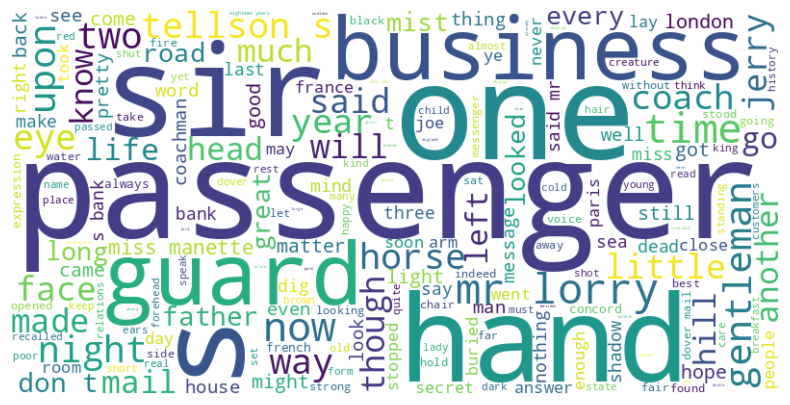

In [ ]:
wordcloud = WordCloud(width=800, height=400, background_color='white',
                      max_words=200, contour_width=3, contour_color='steelblue')

# Generate the word cloud
wordcloud.generate(text_tale)

# Plot the word cloud
plt.figure(figsize=(10, 5))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis('off')  # Hide the axes
plt.show()

## Anaphora detection

In [ ]:
anaphoras_tale = detect_anaphora(sentences_tale)

In [ ]:
print("Number of anaphoras =", len(anaphoras_tale))

Number of anaphoras = 12


In [ ]:
for phrase, indices in anaphoras_tale.items():
    print(f"  {phrase}: {indices}")
print("\n")

  it is likely enough: [(10, 11)]
  the: [(47, 48), (58, 59, 60, 61, 62, 63), (85, 86), (98, 99), (201, 202)]
  the rider: [(84, 85)]
  after: [(103, 104)]
  no more can i: [(111, 112)]
  it was appointed that: [(113, 114)]
  buried how long almost: [(153, 154)]
  he: [(180, 181)]
  i: [(222, 223), (229, 230), (260, 261)]
  like monsieur manette your: [(242, 243)]
  it would be worse: [(303, 304)]
  why: [(316, 317)]




In [ ]:
print(sentences_tale[113], sentences_tale[114])

It was appointed that the book should shut with a spring,
for ever and for ever, when I had read but a page. It was appointed that
the water should be locked in an eternal frost, when the light was playing on its surface, and I stood in ignorance on the shore.


In [ ]:
highlight_anaphoras(sentences_tale, anaphoras_tale)


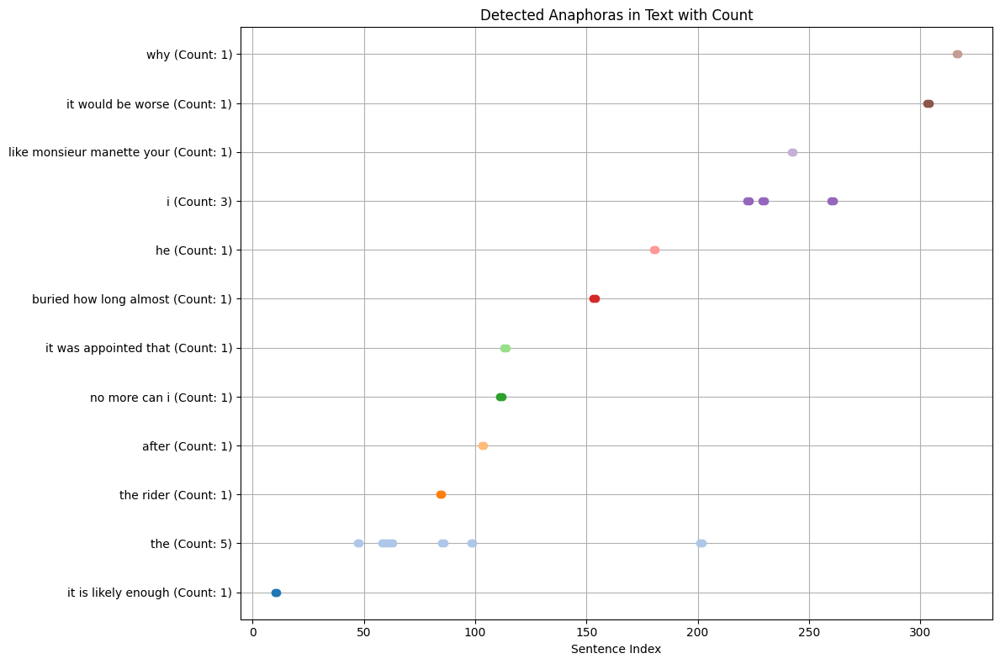

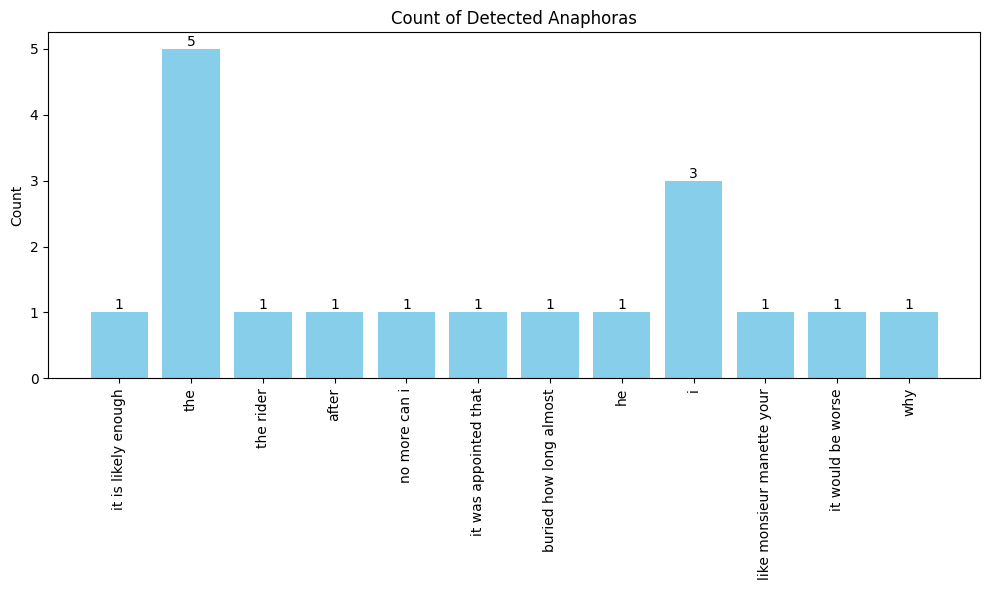

In [ ]:
plot_anaphora(anaphoras_tale, sentences_tale)
plot_anaphora_count(anaphoras_tale)

## Anadiplosis detection

In [ ]:
anadiplosis_tale = detect_anadiplosis(sentences_tale)

In [ ]:
print("Number of anadiplosis =", len(anadiplosis_tale))

Number of anadiplosis = 1


In [ ]:
print("ANADIPLOSIS:")
for phrase, indices in anadiplosis_tale.items():
    print(f"  {phrase}: {indices}")
print("\n")

ANADIPLOSIS:
  jerry: [(124, 125)]




In [ ]:
print(sentences_tale[124], sentences_tale[125])

“It wouldn’t do for you, Jerry. Jerry, you honest tradesman, it
wouldn’t suit your line of business!


In [ ]:
highlight_anadiplosis(sentences_tale, anadiplosis_tale)

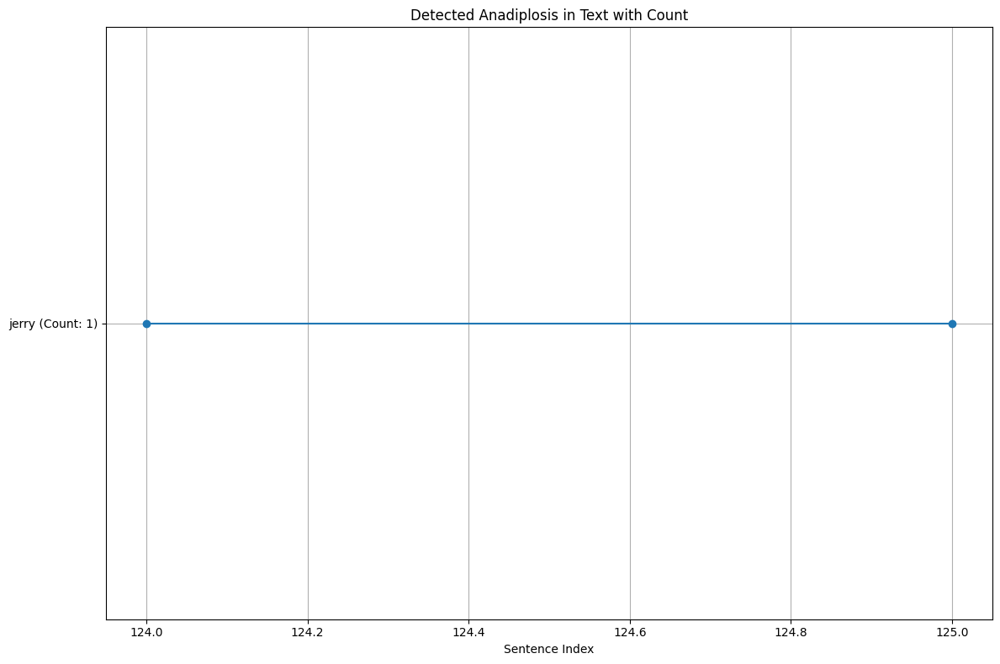

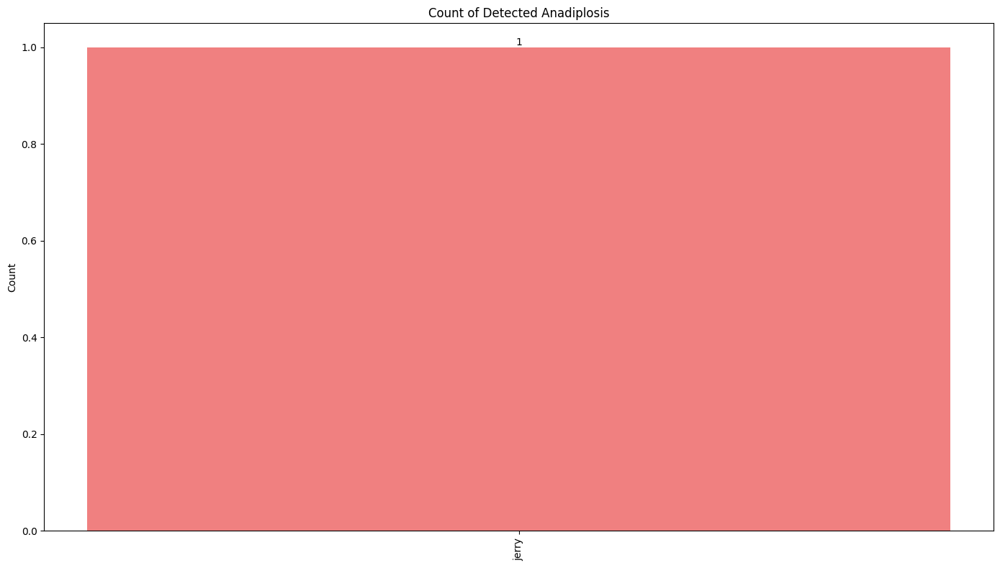

In [ ]:
plot_anadiplosis(anadiplosis_tale, sentences_tale)

# Plot the vertical bar chart of anadiplosis counts
plot_anadiplosis_count(anadiplosis_tale)

## Epistrophe detection

In [ ]:
epistrophes_tale = detect_epistrophe(sentences_tale)

In [ ]:
print("Number of epistrophes =", len(epistrophes_tale))

Number of epistrophes = 10


In [ ]:
print("EPISTROPHE:")
for phrase, indices in epistrophes_tale.items():
    print(f"  {phrase}: {indices}")
print("\n")

EPISTROPHE:
  jerry: [(106, 107)]
  sir: [(166, 167, 168), (190, 191), (195, 196)]
  concord: [(170, 171, 172)]
  yes sir: [(189, 190)]
  time here sir: [(196, 197)]
  of beauvais: [(241, 242)]
  since: [(257, 258)]
  business: [(285, 286)]
  now: [(300, 301)]
  wall: [(314, 315)]




In [ ]:
print(sentences_tale[106], sentences_tale[107])

Much
of that wouldn’t do for you, Jerry! I say, Jerry!


In [ ]:
highlight_epistrophes(sentences_tale, epistrophes_tale)

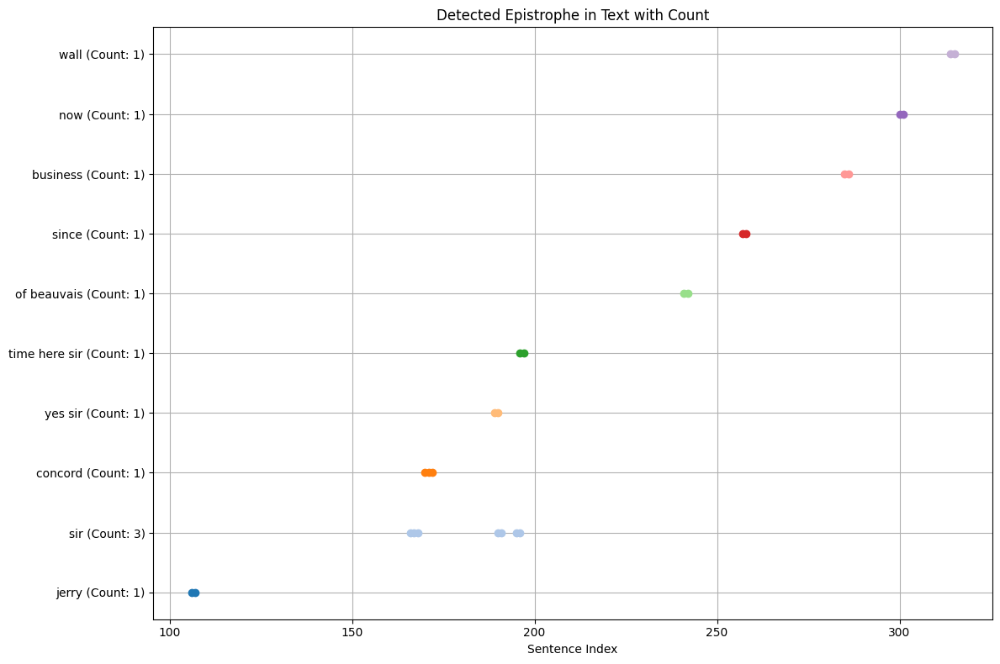

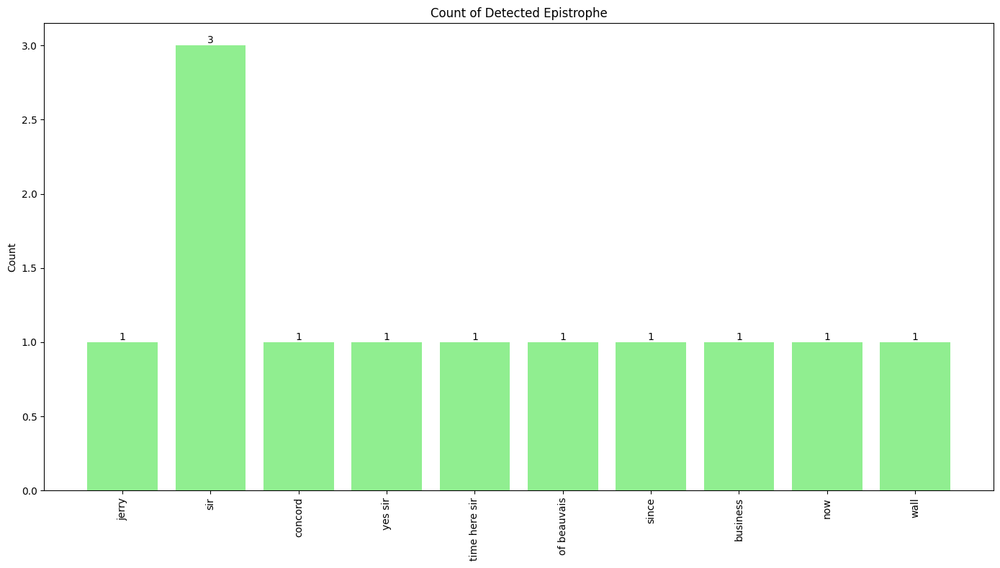

In [ ]:
# Plot the epistrophe results with counts
plot_epistrophe(epistrophes_tale, sentences_tale)

# Plot the vertical bar chart of epistrophe counts
plot_epistrophe_count(epistrophes_tale)

## Epizeuxis detection

In [ ]:
epizeuxis_tale = detect_epizeuxis(sentences_tale)

In [ ]:
print("Number of epizeuxis =", len(epizeuxis_tale))

Number of epizeuxis = 8


In [ ]:
print("EPIZEUXIS:")
for phrase, indices in epizeuxis_tale.items():
    print(f"  {phrase}: {indices}")
print("\n")

EPIZEUXIS:
  the: [18]
  the passengers: [36]
  had: [46]
  digging: [208]
  a daughter: [274]
  that s right: [283]
  there: [299]
  see now: [300]




In [ ]:
print(sentences_tale[36])

The Dover mail was in its usual genial position that the guard suspected the passengers, the passengers suspected one another and the
guard, they all suspected everybody else, and the coachman was sure
of nothing but the horses; as to which cattle he could with a clear conscience have taken his oath on the two Testaments that they were not fit
for the journey.


In [ ]:
highlight_epizeuxis(sentences_tale, epizeuxis_tale)

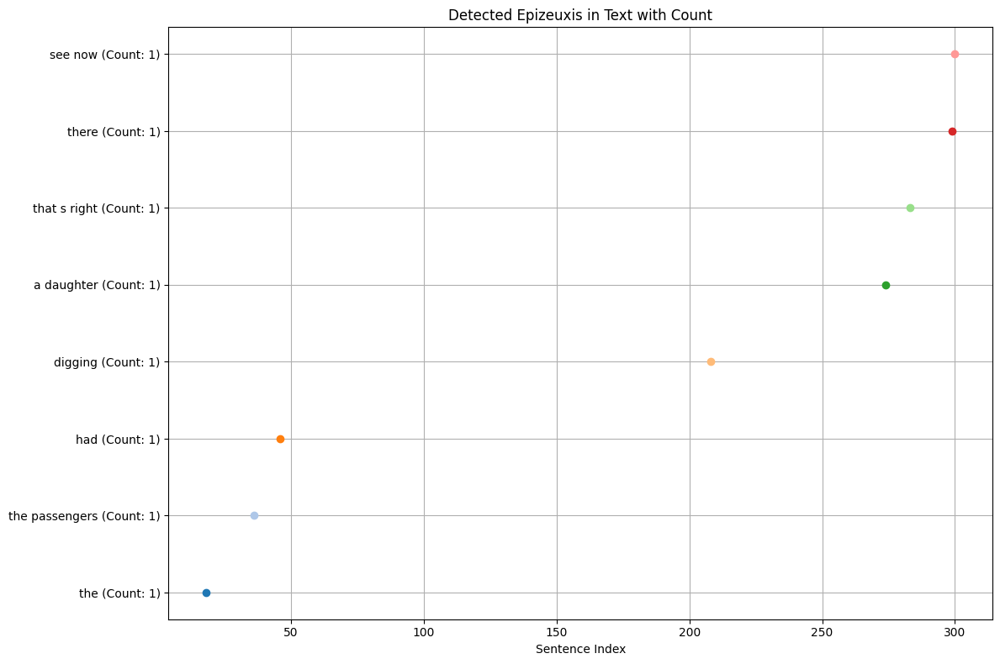

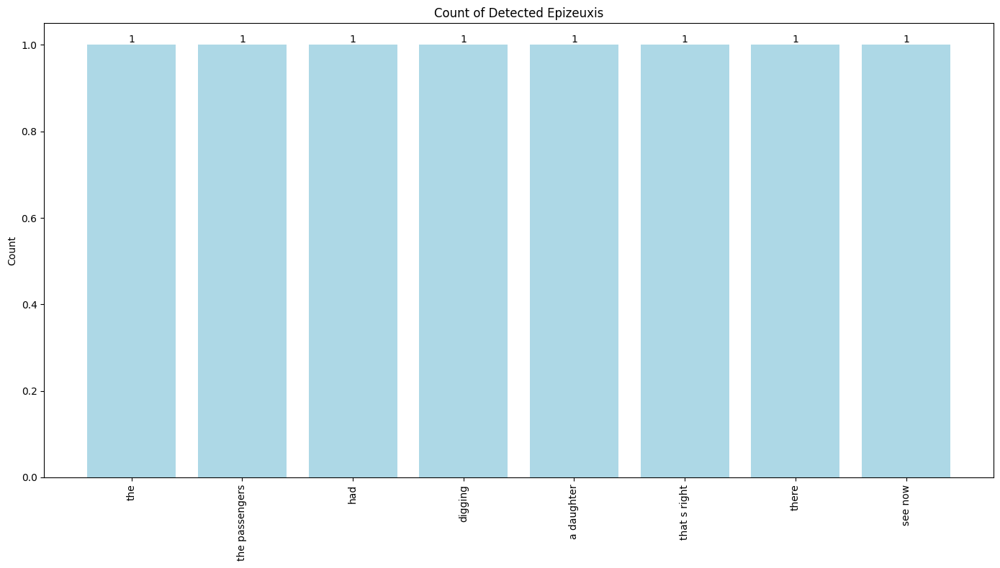

In [ ]:
# Plot the epizeuxis results with counts
plot_epizeuxis(epizeuxis_tale, sentences_tale)

# Plot the vertical bar chart of epizeuxis counts
plot_epizeuxis_bar(epizeuxis_tale)

## Polyptoton detection

In [ ]:
polyptotons_tale = detect_polyptoton(sentences_tale)

In [ ]:
print("Number of polyptotons =", len(polyptotons_tale))

Number of polyptotons = 18


In [ ]:
print("POLYPTOTON:")
for words, indices in polyptotons_tale.items():
    print(f"  {', '.join(words)}: {indices}")
print("\n")

POLYPTOTON:
  it, its: [0, 27, 28, 29, 109, 114, 179]
  year, years: [6]
  rapped, rapping: [6]
  lord, lords: [14]
  walked, walking: [21]
  be, being: [33]
  robber, robbers: [33]
  horse, horses: [43]
  passenger, passengers: [55, 175]
  face, faces: [140]
  plough, ploughed: [156]
  kind, kinds: [175]
  awaited, awaiting: [208]
  like, likeness: [220]
  curtseyed, curtseys: [225]
  pass, passed: [252]
  business, busy: [258]
  confuse, confused: [279]




In [ ]:
print(sentences_tale[156])

There was
a ridge of ploughed land, with a plough upon it where it had been left
last night when the horses were unyoked; beyond, a quiet coppice-wood,
in which many leaves of burning red and golden yellow still remained
upon the trees.


In [ ]:
highlight_polyptotons(sentences_tale, polyptotons_tale)

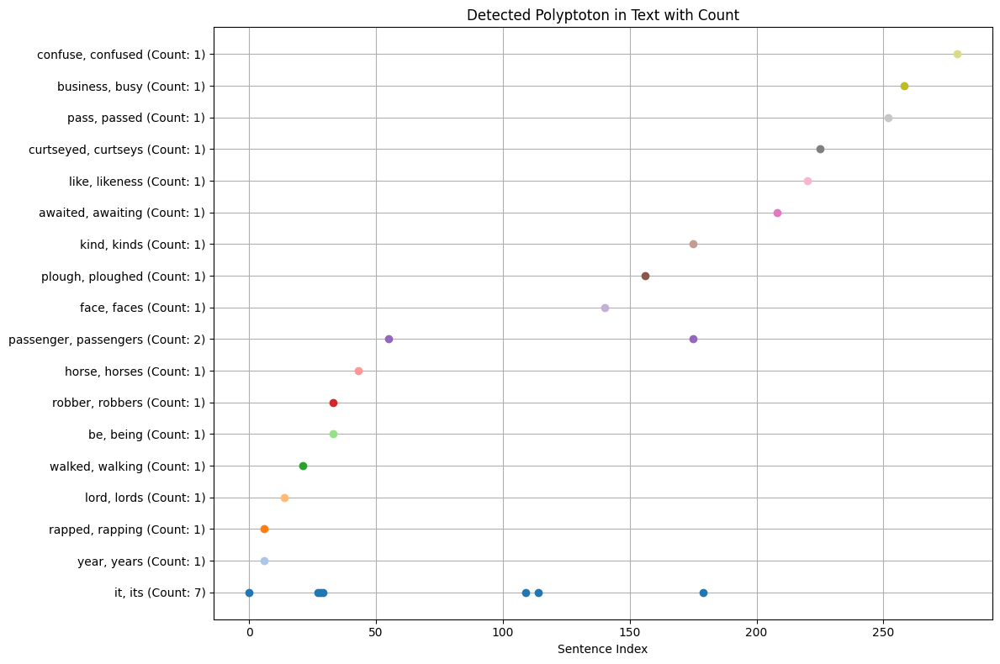

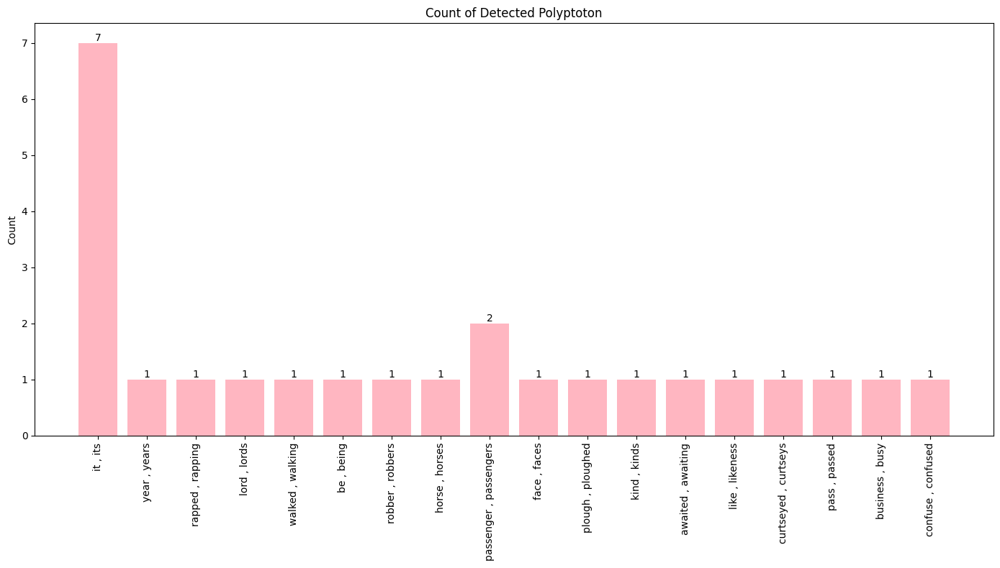

In [ ]:
# Plot the polyptoton results with counts
plot_polyptoton(polyptotons_tale, sentences_tale)

# Plot the vertical bar chart of polyptoton counts
plot_polyptoton_bar(polyptotons_tale)

## Euphony detection

In [ ]:
euphonic_sentences_tale = detect_euphonies(sentences_tale)

In [ ]:
print(len(euphonic_sentences_tale))

305


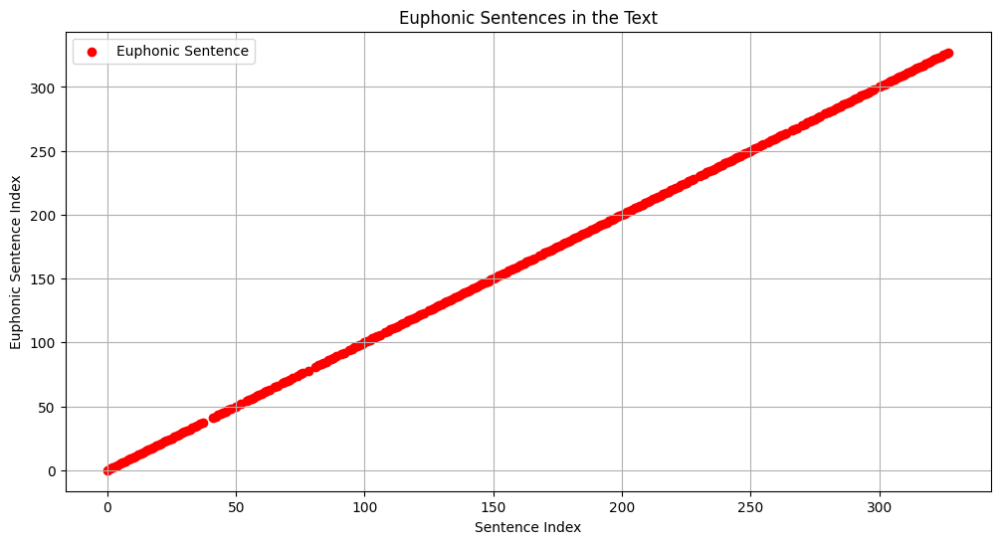

In [ ]:
plot_euphonic_sentences(euphonic_sentences_tale)

## Aliteration detection

In [ ]:
alliterations_tale = detect_alliteration(sentences_tale)

In [ ]:
print("Number of alliterations =", len(alliterations_tale))

Number of alliterations = 1625


In [ ]:
print("ALLITERATION:")
for words, indices in alliterations_tale.items():
    print(f"  {', '.join(words)}: {indices}")
print("\n")

ALLITERATION:
  it, it, it, it, it, it, it, it, it, it, its, its, times, times, to: [0]
  was, was, was, was, was, was, was, was, was, was, was, we, we, we, we, were, were, winter, wisdom, worst: [0]
  other, that, the, the, the, the, the, the, the, the, the, the, the, the, the, the: [0]
  before, before, being, belief, best: [0]
  everything, evil, of, of, of, of, of, of, of, of, of, of, of, of: [0]
  age, age: [0]
  far, foolishness, for, for: [0]
  epoch, epoch, period, period, present: [0]
  in, incredulity, insisted, noisiest, nothing, on, only: [0]
  season, season, so, some, spring, superlative, us, us: [0]
  all, all, light, like: [0]
  darkness, degree, despair, direct, direct: [0]
  had, had, heaven, hope: [0]
  going, going, good: [0]
  or, received: [0]
  the, the, there, there: [1]
  were, were, with, with, with, with: [1]
  king, king, queen, queen: [1]
  large, large: [1]
  jaw, jaw: [1]
  and, and, on, on: [1]
  face, face, fair, france: [1]
  throne, throne: [1]
  of, 

In [ ]:
curr_sentence = sentences_tale[85].replace("\n", " ")
for key in ('hat', 'hoofs', 'horse', 'horse', 'horse'):
  word_regex = r'\b' + re.escape(key) + r'\b'  # '^' asserts position at start of the string
  curr_sentence = re.sub(word_regex, f"<span style='color: red;'>{key}</span>", curr_sentence, flags=re.IGNORECASE)

display(HTML(curr_sentence))  # Use print(sentence) if not in a Jupyter environment

curr_sentence = sentences_tale[76].replace("\n", " ")
for key in ('can', 'close', 'come'):
  word_regex = r'\b' + re.escape(key) + r'\b'  # '^' asserts position at start of the string
  curr_sentence = re.sub(word_regex, f"<span style='color: red;'>{key}</span>", curr_sentence.lstrip('—_-_—').rstrip('—_-_—'), flags=re.IGNORECASE)

display(HTML(curr_sentence))  # Use print(sentence) if not in a Jupyter environment

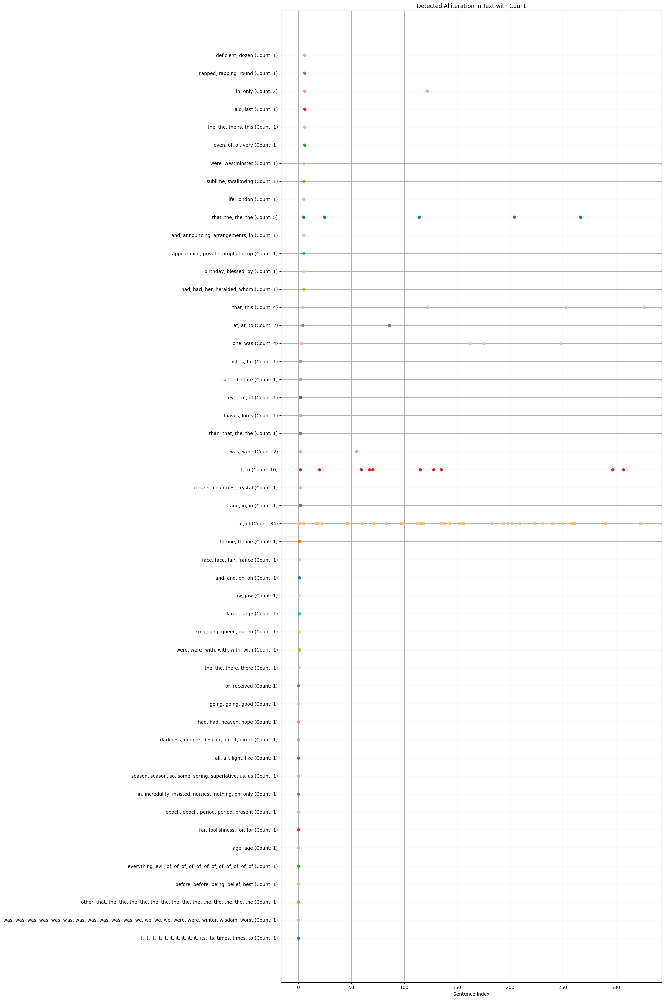

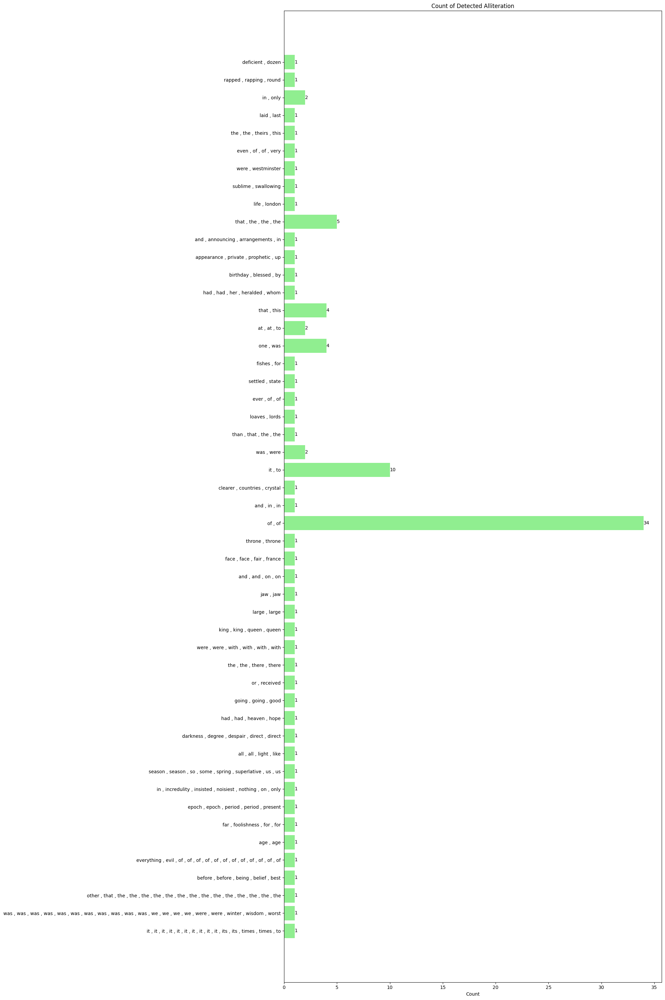

In [ ]:
alliterations_sub_tale = dict(list(alliterations_tale.items())[:50])

# Plot the alliteration results with counts
plot_alliteration(alliterations_sub_tale, sentences_tale)

# Plot the vertical bar chart of alliteration counts
plot_alliteration_count(alliterations_sub_tale)

## Consonance detection

In [ ]:
consonances_tale = detect_consonance(sentences_tale)

In [ ]:
print("Number of consonances =", len(consonances_tale))

Number of consonances = 2317


In [ ]:
# Output the results for consonance
print("CONSONANCE:")
for words, indices in consonances_tale.items():
    print(f"  {', '.join(words)}: {indices}")
print("\n")

CONSONANCE:
  best, direct, incredulity, it, light, noisiest, present, short, superlative, that, to, winter, worst: [0]
  other, that, the: [0, 198]
  before, belief, best: [0]
  best, comparison, despair, noisiest, season, so, some, superlative, worst: [0]
  evil, heaven, of, superlative: [0]
  we, were, winter, wisdom, worst: [0]
  noisiest, present, season, wisdom: [0]
  degree, despair, direct, good, had, incredulity, period, wisdom: [0]
  comparison, some, wisdom: [0]
  comparison, despair, epoch, hope, period, present, superlative: [0]
  comparison, direct, epoch, incredulity, like: [0]
  all, belief, evil, incredulity, light, like, only, superlative: [0]
  before, belief, far, for: [0]
  comparison, heaven, in, incredulity, noisiest, on, only, present, season, winter: [0]
  before, comparison, degree, despair, far, for, incredulity, or, period, present, short: [0]
  had, heaven, hope: [0]
  degree, good: [0]
  the, there, with: [1, 86, 156]
  fair, france, large, there, throne: 

In [ ]:
curr_sentence = sentences_tale[291].replace("\n", " ")
for key in ('expression', 'forehead', 'horror', 'particularly'):
  word_regex = r'\b' + re.escape(key) + r'\b'  # '^' asserts position at start of the string
  curr_sentence = re.sub(word_regex, f"<span style='color: red;'>{key}</span>", curr_sentence, flags=re.IGNORECASE)

display(HTML(curr_sentence))  # Use print(sentence) if not in a Jupyter environment

curr_sentence = sentences_tale[297].replace("\n", " ")
for key in ('distinct', 'ghost', 'said', 'see', 'voice'):
  word_regex = r'\b' + re.escape(key) + r'\b'  # '^' asserts position at start of the string
  curr_sentence = re.sub(word_regex, f"<span style='color: red;'>{key}</span>", curr_sentence.lstrip('—_-_—').rstrip('—_-_—'), flags=re.IGNORECASE)

display(HTML(curr_sentence))  # Use print(sentence) if not in a Jupyter environment

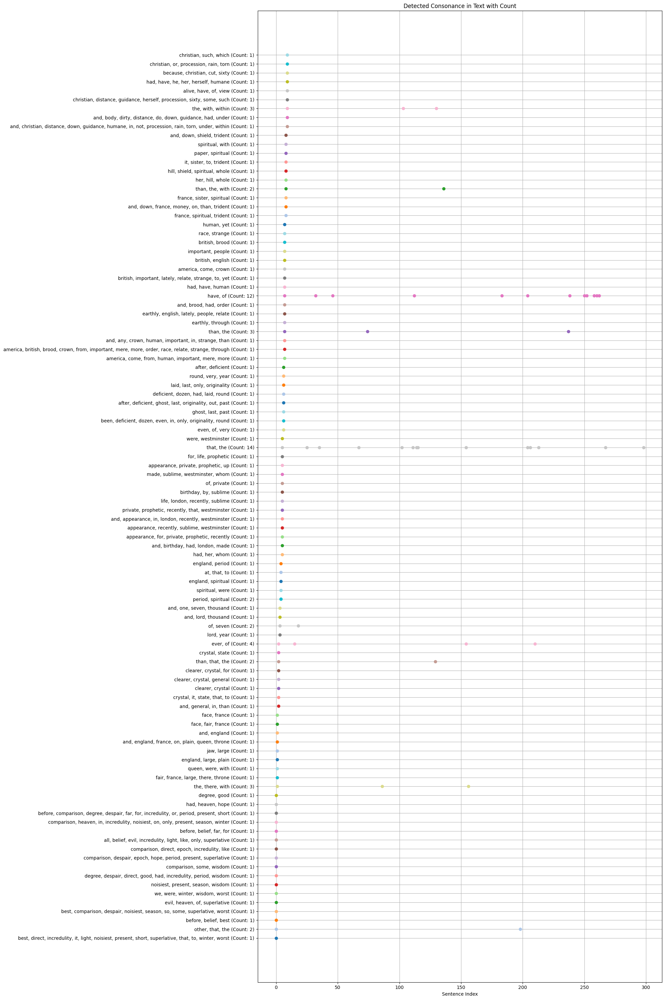

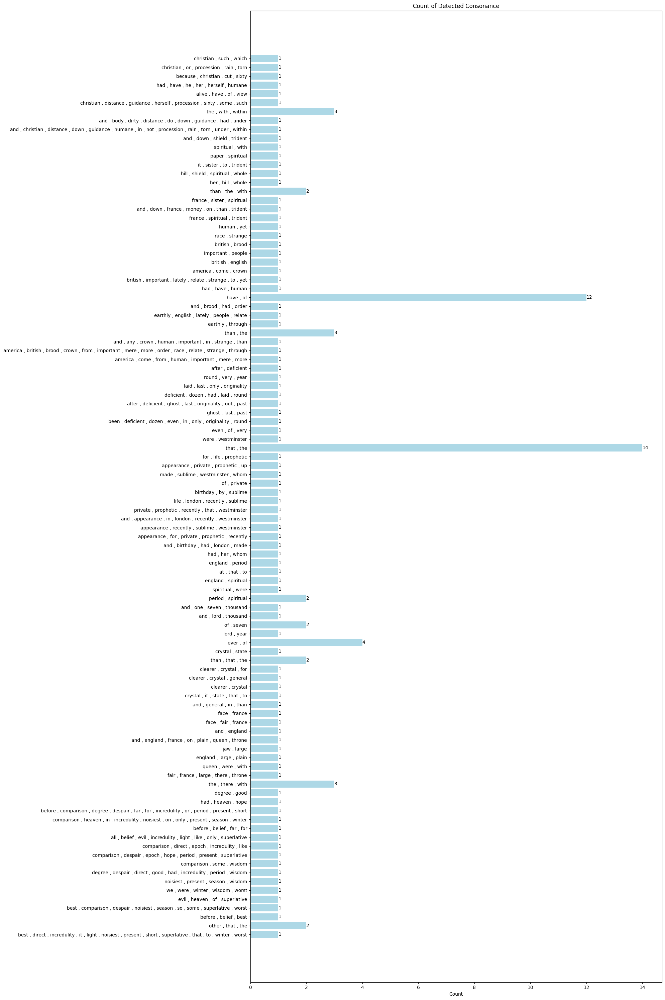

In [ ]:
consonances_sub_tale = dict(list(consonances_tale.items())[:100])

# Plot the alliteration results with counts
plot_consonance(consonances_sub_tale, sentences)

# Plot the vertical bar chart of alliteration counts
plot_consonance_count(consonances_sub_tale)

## Assonance detection

In [ ]:
assonances_tale = detect_assonance(sentences_tale)

In [ ]:
print("Number of assonances =", len(assonances_tale))

Number of assonances = 2140


In [ ]:
print("ASSONANCE:")
for words, indices in assonances_tale.items():
    print(f"  {', '.join(words)}: {indices}")
print("\n")

ASSONANCE:
  insisted, it, its, period, spring, winter, wisdom: [0]
  darkness, far, on, was: [0]
  authorities, comparison, darkness, epoch, evil, foolishness, heaven, incredulity, insisted, noisiest, period, present, received, season, superlative, the, wisdom: [0]
  best, comparison, despair, direct, epoch, everything, heaven, present: [0]
  nothing, of, other, some, us: [0]
  light, like, times: [0]
  superlative, worst: [0]
  foolishness, incredulity, to: [0]
  before, being, belief, degree, despair, foolishness, going, in, incredulity, insisted, nothing, superlative: [0]
  being, belief, degree, evil, received, season, we: [0]
  everything, incredulity: [0]
  authorities, everything, incredulity, noisiest, only, period: [0]
  going, hope, only, so: [0]
  direct, other, were, winter: [0]
  had, that: [0, 5, 113, 289]
  all, authorities, before, for, or, short: [0]
  fair, there: [1]
  a, and, england, the: [1]
  england, king, with: [1]
  large, on: [1]
  face, plain: [1]
  both, l

In [ ]:
a = get_vowel_sounds('business')
b = get_vowel_sounds('and')

print(a,b)

['IH1', 'AH0'] ['AH0']


In [ ]:
curr_sentence = sentences_tale[326].replace("\n", " ")
for key in ('lorry', 'pause', 'strong'):
  word_regex = r'\b' + re.escape(key) + r'\b'  # '^' asserts position at start of the string
  curr_sentence = re.sub(word_regex, f"<span style='color: red;'>{key}</span>", curr_sentence, flags=re.IGNORECASE)

display(HTML(curr_sentence))  # Use print(sentence) if not in a Jupyter environment

curr_sentence = sentences_tale[315].replace("\n", " ")
for key in ('his', 'really', 'think', 'this', 'with'):
  word_regex = r'\b' + re.escape(key) + r'\b'  # '^' asserts position at start of the string
  curr_sentence = re.sub(word_regex, f"<span style='color: red;'>{key}</span>", curr_sentence.lstrip('—_-_—').rstrip('—_-_—'), flags=re.IGNORECASE)

display(HTML(curr_sentence))  # Use print(sentence) if not in a Jupyter environment

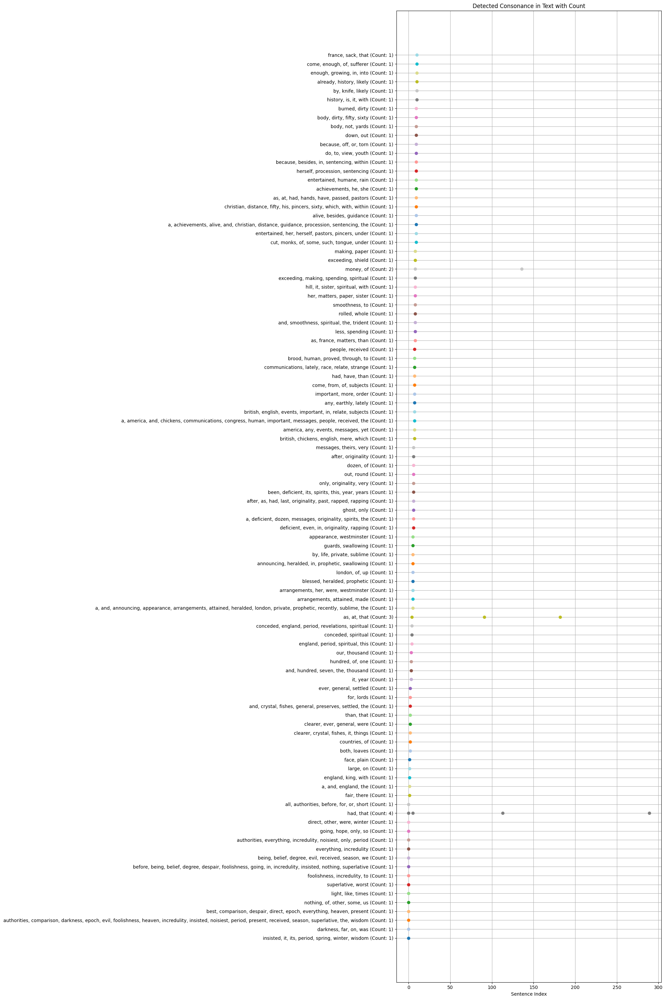

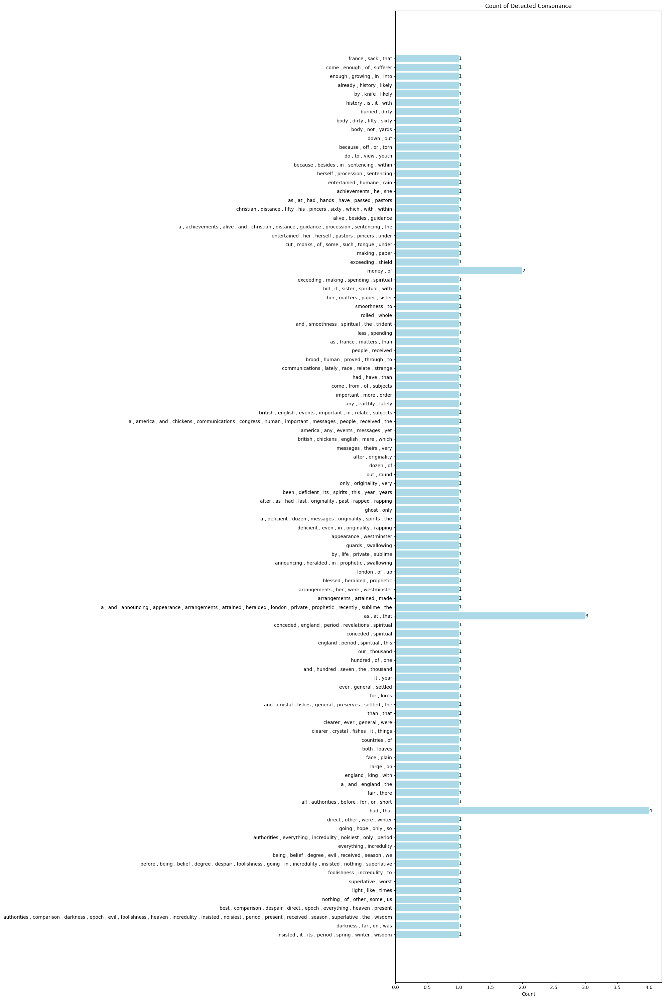

In [ ]:
assonances_sub_tale = dict(list(assonances_tale.items())[:100])

# Plot the alliteration results with counts
plot_consonance(assonances_sub_tale, sentences)

# Plot the vertical bar chart of alliteration counts
plot_consonance_count(assonances_sub_tale)

## Sibilance detection

In [ ]:
sibilances_tale = detect_sibilance(sentences_tale)

In [ ]:
print("Number of sibilances =", len(sibilances_tale))

Number of sibilances = 462


In [ ]:
print("SIBILANCE:")
for words, indices in sibilances_tale.items():
    print(f"  {', '.join(words)}: {indices}")
print("\n")

SIBILANCE:
  authorities, noisiest, present, season, times, was, wisdom: [0]
  best, comparison, darkness, despair, foolishness, insisted, its, noisiest, received, season, so, some, spring, superlative, us, worst: [0]
  foolishness, short: [0]
  face, france: [1]
  countries, fishes, loaves, lords, preserves, things, was: [2]
  crystal, settled, state: [2]
  thousand, was: [3]
  conceded, spiritual, this: [4]
  as, revelations: [4]
  announcing, appearance, arrangements, blessed, recently, sublime, swallowing, westminster: [5]
  ghost, its, last, messages, past, spirits, this: [6]
  as, dozen, messages, theirs, years: [6]
  congress, events, messages, race, received, strange, subjects: [7]
  chickens, communications, messages: [7]
  british, communications, english: [7]
  chickens, which: [7]
  exceeding, france, less, sister, smoothness, spending, spiritual: [8]
  as, matters: [8]
  achievements, besides, christian, distance, guidance, herself, monks, passed, pastors, pincers, process

In [ ]:
curr_sentence = sentences_tale[234].replace("\n", " ")
for key in ('as', 'besides', 'raised', 'was'):
  word_regex = r'\b' + re.escape(key) + r'\b'  # '^' asserts position at start of the string
  curr_sentence = re.sub(word_regex, f"<span style='color: red;'>{key}</span>", curr_sentence.lstrip('—_-_—').rstrip('—_-_—'), flags=re.IGNORECASE)

display(HTML(curr_sentence))  # Use print(sentence) if not in a Jupyter environment

curr_sentence = sentences_tale[222].replace("\n", " ")
for key in ('kiss', 'miss', 'said', 'seat'):
  word_regex = r'\b' + re.escape(key) + r'\b'  # '^' asserts position at start of the string
  curr_sentence = re.sub(word_regex, f"<span style='color: red;'>{key}</span>", curr_sentence.lstrip('—_-_—').rstrip('—_-_—'), flags=re.IGNORECASE)

display(HTML(curr_sentence))  # Use print(sentence) if not in a Jupyter environment

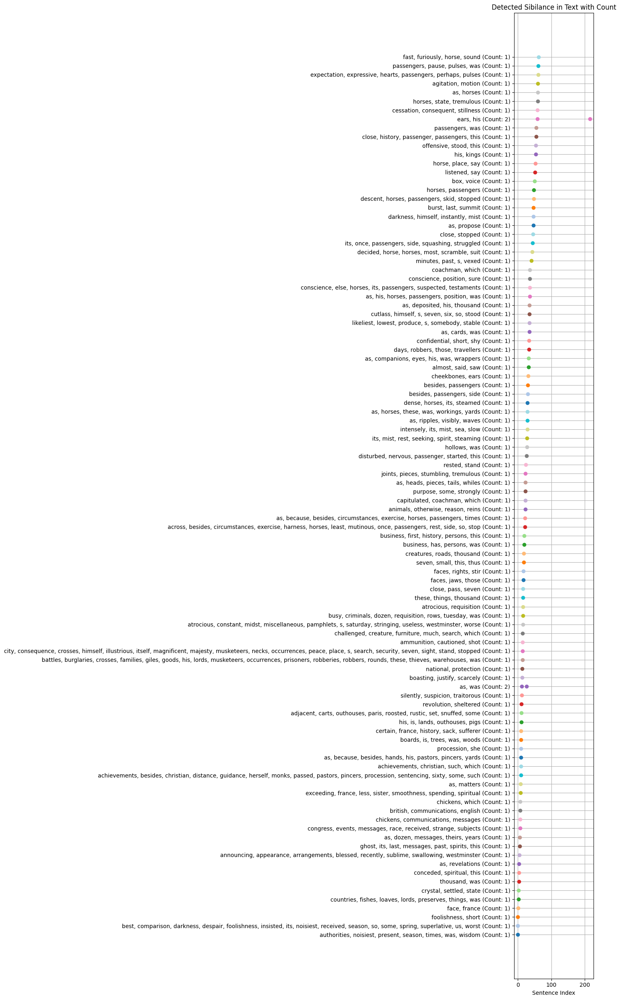

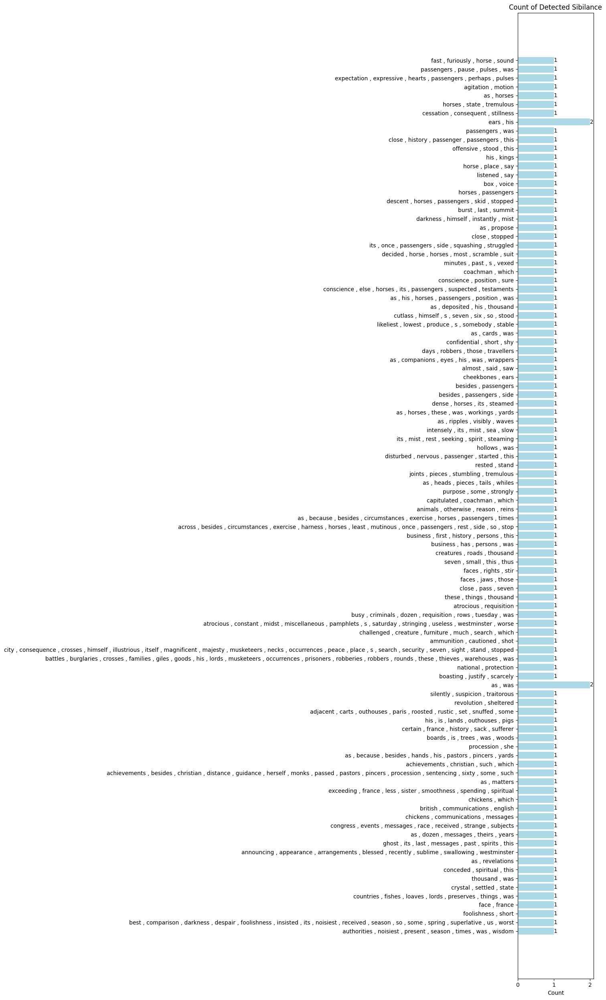

In [ ]:
sibilances_sub_tale = dict(list(sibilances_tale.items())[:100])

# Plot the sibilance results with counts
plot_sibilance(sibilances_sub_tale, sentences_tale)

# Plot the horizontal bar chart of sibilance counts
plot_sibilance_count(sibilances_sub_tale)

## Polyphonic analysis

In [44]:
words_tale = [word_tokenize(sentence) for sentence in sentences_tale]
words_tale = [[word.lower() for word in word_list if word.isalpha()] for word_list in words_tale]
# Remove stop words
stop_words = set(stopwords.words('english'))
words_tale = [[word for word in word_list if word not in stop_words] for word_list in words_tale]

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


In [45]:
nlp_tale = spacy.load("en_core_web_sm")
doc_tale = nlp_tale(text_tale)
pos_tags_tale = [(token.text, token.pos_) for token in doc_tale]
entities_tale = [(entity.text, entity.label_) for entity in doc_tale.ents]

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


In [46]:
print("POS Tags:", pos_tags_tale)
print("Named Entities:", entities_tale)

POS Tags: [('\t', 'SPACE'), ('it', 'PRON'), ('was', 'AUX'), ('the', 'DET'), ('best', 'ADJ'), ('of', 'ADP'), ('times', 'NOUN'), ('it', 'PRON'), ('was', 'AUX'), ('the', 'DET'), ('worst', 'ADJ'), ('of', 'ADP'), ('times', 'NOUN'), ('it', 'PRON'), ('was', 'AUX'), ('the', 'DET'), ('age', 'NOUN'), ('of', 'ADP'), ('\n', 'SPACE'), ('wisdom', 'NOUN'), ('it', 'PRON'), ('was', 'AUX'), ('the', 'DET'), ('age', 'NOUN'), ('of', 'ADP'), ('foolishness', 'NOUN'), ('it', 'PRON'), ('was', 'AUX'), ('the', 'DET'), ('epoch', 'NOUN'), ('of', 'ADP'), ('belief', 'NOUN'), ('it', 'PRON'), ('was', 'AUX'), ('\n', 'SPACE'), ('the', 'DET'), ('epoch', 'NOUN'), ('of', 'ADP'), ('incredulity', 'NOUN'), ('it', 'PRON'), ('was', 'AUX'), ('the', 'DET'), ('season', 'NOUN'), ('of', 'ADP'), ('light', 'NOUN'), ('it', 'PRON'), ('was', 'AUX'), ('the', 'DET'), ('season', 'NOUN'), ('of', 'ADP'), ('\n', 'SPACE'), ('darkness', 'NOUN'), ('it', 'PRON'), ('was', 'AUX'), ('the', 'DET'), ('spring', 'NOUN'), ('of', 'ADP'), ('hope', 'NOUN'), 

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)
<ipython-input-47-229b3b147a02>:11: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=list(pos_counts_tale.keys()), y=list(pos_counts_tale.values()), palette='viridis')


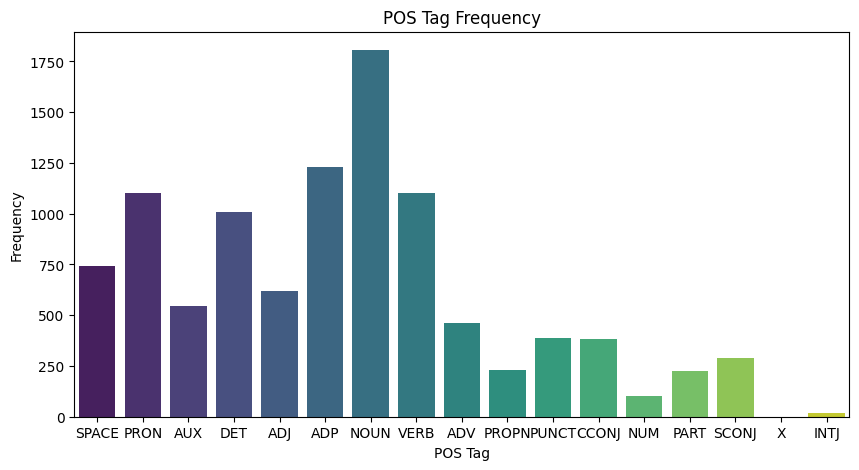

<ipython-input-47-229b3b147a02>:19: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=list(entity_counts_tale.keys()), y=list(entity_counts_tale.values()), palette='viridis')


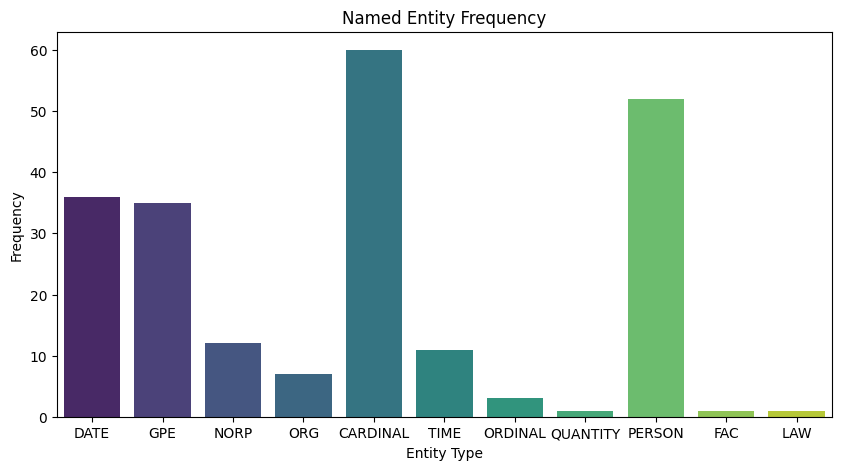

In [47]:
# Extract POS tags and named entities
pos_tags_tale = [token.pos_ for token in doc_tale]
entities_tale = [entity.label_ for entity in doc_tale.ents]

# Count POS tags and named entities
pos_counts_tale = Counter(pos_tags_tale)
entity_counts_tale = Counter(entities_tale)

# Plot POS tags
plt.figure(figsize=(10, 5))
sns.barplot(x=list(pos_counts_tale.keys()), y=list(pos_counts_tale.values()), palette='viridis')
plt.title("POS Tag Frequency")
plt.xlabel("POS Tag")
plt.ylabel("Frequency")
plt.show()

# Plot named entities
plt.figure(figsize=(10, 5))
sns.barplot(x=list(entity_counts_tale.keys()), y=list(entity_counts_tale.values()), palette='viridis')
plt.title("Named Entity Frequency")
plt.xlabel("Entity Type")
plt.ylabel("Frequency")
plt.show()


/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)
<ipython-input-48-8297e6a3575c>:8: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=pos_distribution_tale.index, y=pos_distribution_tale.values, palette='viridis')


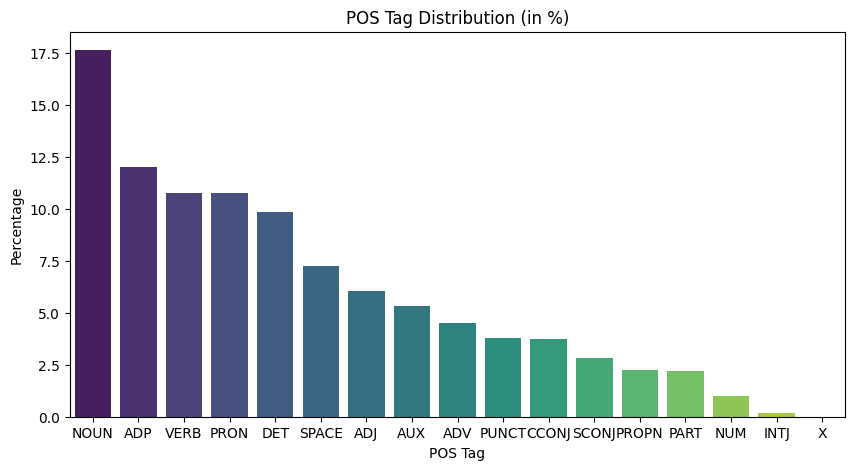

<ipython-input-48-8297e6a3575c>:17: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=entity_distribution_tale.index, y=entity_distribution_tale.values, palette='viridis')


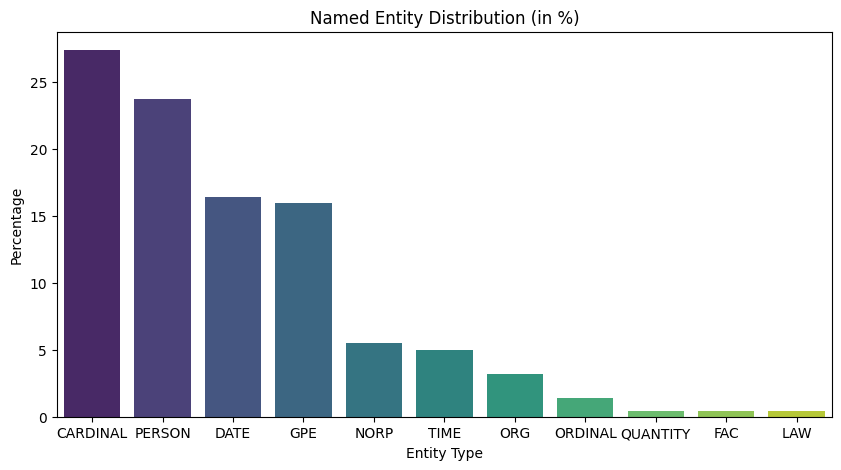

In [48]:
# Convert POS tags to DataFrame for further analysis
pos_df_tale = pd.DataFrame(pos_tags_tale, columns=["POS"])
entity_df_tale = pd.DataFrame(entities_tale, columns=["Entity"])

# Calculate and plot the distribution of POS tags in percentages
pos_distribution_tale = pos_df_tale['POS'].value_counts(normalize=True) * 100
plt.figure(figsize=(10, 5))
sns.barplot(x=pos_distribution_tale.index, y=pos_distribution_tale.values, palette='viridis')
plt.title("POS Tag Distribution (in %)")
plt.xlabel("POS Tag")
plt.ylabel("Percentage")
plt.show()

# Calculate and plot the distribution of named entities in percentages
entity_distribution_tale = entity_df_tale['Entity'].value_counts(normalize=True) * 100
plt.figure(figsize=(10, 5))
sns.barplot(x=entity_distribution_tale.index, y=entity_distribution_tale.values, palette='viridis')
plt.title("Named Entity Distribution (in %)")
plt.xlabel("Entity Type")
plt.ylabel("Percentage")
plt.show()

In [49]:
sentiments_tale = [TextBlob(sentence).sentiment for sentence in sentences_tale]
average_polarity_tale = sum(sent.polarity for sent in sentiments_tale) / len(sentiments_tale)
average_subjectivity_tale = sum(sent.subjectivity for sent in sentiments_tale) / len(sentiments_tale)
# Count sentiment categories
positive_sentences_tale = sum(1 for sent in sentiments_tale if sent.polarity > 0)
negative_sentences_tale = sum(1 for sent in sentiments_tale if sent.polarity < 0)
neutral_sentences_tale = sum(1 for sent in sentiments_tale if sent.polarity == 0)

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


In [50]:
# Print aggregate scores
print(f"Average Polarity: {average_polarity_tale:.2f}")
print(f"Average Subjectivity: {average_subjectivity_tale:.2f}")
print(f"Positive Sentences: {positive_sentences_tale}")
print(f"Negative Sentences: {negative_sentences_tale}")
print(f"Neutral Sentences: {neutral_sentences_tale}")

Average Polarity: 0.04
Average Subjectivity: 0.34
Positive Sentences: 136
Negative Sentences: 73
Neutral Sentences: 119


/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


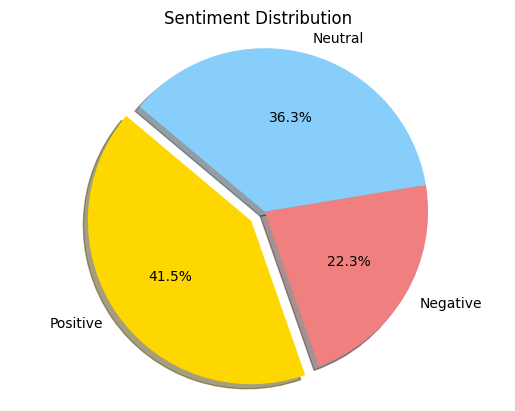

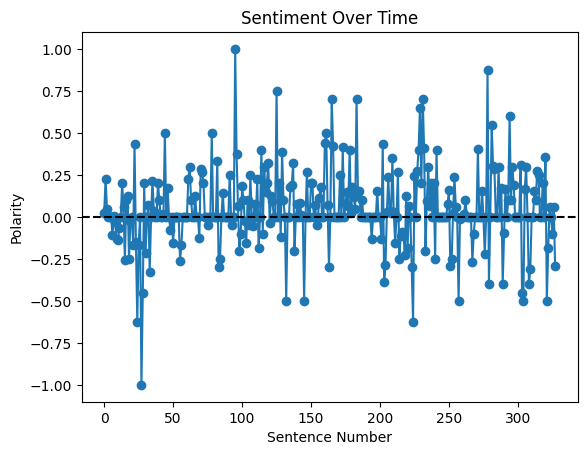

In [51]:
labels = 'Positive', 'Negative', 'Neutral'
sizes_tale = [positive_sentences_tale, negative_sentences_tale, neutral_sentences_tale]
colors = ['gold', 'lightcoral', 'lightskyblue']
explode = (0.1, 0, 0)

plt.pie(sizes_tale, explode=explode, labels=labels, colors=colors,
autopct='%1.1f%%', shadow=True, startangle=140)

plt.axis('equal')
plt.title("Sentiment Distribution")
plt.show()

# Visualize sentiment over time
polarity_scores_tale = [sent.polarity for sent in sentiments_tale]
plt.plot(polarity_scores_tale, marker='o')
plt.title("Sentiment Over Time")
plt.xlabel("Sentence Number")
plt.ylabel("Polarity")
plt.axhline(y=0, color='k', linestyle='--')
plt.show()

In [52]:
print("Sentiments:", sentiments_tale)

Sentiments: [Sentiment(polarity=0.022916666666666658, subjectivity=0.5895833333333332), Sentiment(polarity=0.22857142857142856, subjectivity=0.5285714285714286), Sentiment(polarity=0.05000000000000002, subjectivity=0.5), Sentiment(polarity=0.0, subjectivity=0.0), Sentiment(polarity=0.0, subjectivity=0.13333333333333333), Sentiment(polarity=0.0, subjectivity=0.3125), Sentiment(polarity=-0.10833333333333334, subjectivity=0.4527777777777778), Sentiment(polarity=0.006249999999999992, subjectivity=0.35625), Sentiment(polarity=-0.030555555555555558, subjectivity=0.2222222222222222), Sentiment(polarity=-0.13111111111111112, subjectivity=0.3977777777777778), Sentiment(polarity=-0.1402116402116402, subjectivity=0.6600529100529101), Sentiment(polarity=-0.06666666666666667, subjectivity=0.5499999999999999), Sentiment(polarity=0.0, subjectivity=0.1), Sentiment(polarity=0.2, subjectivity=0.2), Sentiment(polarity=0.059027777777777755, subjectivity=0.4618055555555555), Sentiment(polarity=-0.258333333

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


In [53]:
dictionary_tale = corpora.Dictionary(words_tale)
corpus_tale = [dictionary_tale.doc2bow(word_list) for word_list in words]
lda_tale = LdaModel(corpus_tale, num_topics=5, id2word=dictionary_tale, passes=15)

# Re-run the analysis and print topics
topics_tale = lda_tale.print_topics(num_words=4)
print("Refined Topics:")
for topic in topics_tale:
    print(topic)

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


Refined Topics:
(0, '0.064*"one" + 0.038*"last" + 0.029*"rose" + 0.024*"miss"')
(1, '0.047*"said" + 0.032*"mr" + 0.032*"see" + 0.029*"words"')
(2, '0.034*"first" + 0.030*"saw" + 0.027*"like" + 0.021*"hear"')
(3, '0.027*"wait" + 0.021*"came" + 0.020*"call" + 0.016*"mean"')
(4, '0.032*"good" + 0.028*"hair" + 0.024*"look" + 0.024*"lost"')


In [54]:
# Visualize topics using pyLDAvis
vis_data_tale = gensimvis.prepare(lda_tale, corpus_tale, dictionary_tale)

# Save the visualization as an HTML file
pyLDAvis.save_html(vis_data_tale, 'lda_vis.html')

# Display the visualization in Jupyter Notebook (if running in a Jupyter environment)
pyLDAvis.display(vis_data_tale)

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)
